# 0.MOUNTING GOOGLE DRIVE

In [9]:
from google.colab import drive
drive.mount('/content/drive')

GD_PATH = '/content/drive/my-drive/data'

ModuleNotFoundError: No module named 'google'

In [ ]:
GD_PATH

NameError: name 'GD_PATH' is not defined

#0.IMPORTS

In [2]:
import random
import numpy as np
from csv import reader
import matplotlib.pyplot as plt
import os


#1.IMPORTING DATA

In [5]:
#1. IMPORTING AND PREPROCESSING DATA

def importData(dataset_csv,ratio=0.7,shuffle=True):
    
    #1.Importing [dataset_csv] into a 2D list [data], each line as 1 row
    data = list()
    with open(dataset_csv, 'r') as file:
        file = reader(file)
        for row in file:
            data.append(row)
    
    #2.removing headers , first row
    data.pop(0)

    #3.converting from string to float form, except last column (target class, y)
    ncol = len(data[0])
    for column in range(ncol-1): #ncol-1 , means last column skipped     
        for row in data:
            row[column] = float(row[column].strip())

            
    #4. converting last column, [target or y] to integer
      #for example 'Good','Bad' => 0,1
    
      #adding target classes to a set
    s = set()
    
    for i in range(len(data)):
        s.add(data[i][-1])
            
    sl = list(s) # converting set into list, contains unique values only
    
      #replacing class names with numbers 
    for i in range(len(data)):
        for j in range(len(sl)):
            if(data[i][-1]==sl[j]):
                data[i][-1]=j;     
        
    
    data = np.array(data) #convert into numpy array
    
    #5. Shuffle rows if [shuffle] parameter is True

    if shuffle==True:
      np.random.seed(10)
      np.random.shuffle(data)
    
    #6.Extracting target
    Y = data[:,-1] #copy last column as Y
    Y=Y.reshape(len(Y),1)
    Y=np.array(Y,dtype=int) #convert Y from float to int,  1.0 =1, 0.0 =0
    X=np.delete(data,-1,1); #remove last column, rest is our X
    
    #7.standartization, according to
    # http://www.holehouse.org/mlclass/04_Linear_Regression_with_multiple_variables.html
    
    for i in range(len(X[0])):
        X[:,i] = (X[:,i]-np.mean(X[:,i]))/np.std(X[:,i])
        
    #8.Adding bias term train data, (adding a new column to X,all elements=1)
    bias = np.ones((len(X),1));
    X=np.hstack((bias,X)); # 1 | X = 1X

    #9.Splitting data into training and test data
    #if ratio is 0.7 %70 will be train %30 will be test
    X, Xtest = np.split(X,[int(ratio * len(X))])
    Y, Ytest = np.split(Y,[int(ratio * len(Y))])
    
    return [X,Y,Xtest,Ytest]

In [ ]:

    #3.converting from string to float form, except last column (target class, y)
    ncol = len(data[0])
    for column in range(ncol-1): #ncol-1 , means last column skipped     
        for row in data:
            row[column] = float(row[column].strip())

            
    #4. converting last column, [target or y] to integer
      #for example 'Good','Bad' => 0,1
    
      #adding target classes to a set
    s = set()
    
    for i in range(len(data)):
        s.add(data[i][-1])
            
    sl = list(s) # converting set into list, contains unique values only
    
      #replacing class names with numbers 
    for i in range(len(data)):
        for j in range(len(sl)):
            if(data[i][-1]==sl[j]):
                data[i][-1]=j;     
        
    
    data = np.array(data) #convert into numpy array
    
    #5. Shuffle rows if [shuffle] parameter is True

    if shuffle==True:
      np.random.seed(10)
      np.random.shuffle(data)
    
    #6.Extracting target
    Y = data[:,-1] #copy last column as Y
    Y=Y.reshape(len(Y),1)
    Y=np.array(Y,dtype=int) #convert Y from float to int,  1.0 =1, 0.0 =0
    X=np.delete(data,-1,1); #remove last column, rest is our X
    
    #7.standartization, according to
    # http://www.holehouse.org/mlclass/04_Linear_Regression_with_multiple_variables.html
    
    for i in range(len(X[0])):
        X[:,i] = (X[:,i]-np.mean(X[:,i]))/np.std(X[:,i])
        
    #8.Adding bias term train data, (adding a new column to X,all elements=1)
    bias = np.ones((len(X),1));
    X=np.hstack((bias,X)); # 1 | X = 1X

    #9.Splitting data into training and test data
    #if ratio is 0.7 %70 will be train %30 will be test
    X, Xtest = np.split(X,[int(ratio * len(X))])
    Y, Ytest = np.split(Y,[int(ratio * len(Y))])
    
    return [X,Y,Xtest,Ytest]

# 2.NEURAL NETWORK with 3 HIDDEN LAYERS

In [6]:
#2. NEURAL NETWORK

#2.1 Activation Function
def g(h):
    return 1/(1+np.exp(-h)) #logistic function

def g_prime(h):
    return g(h)*(1-g(h))   #derivative of logistic function


def train(model,data,y,num_hidden_nodes=128,LR=0.1,REG=0.5,epochs =1,batchsize=10):
    '''
    Neural newtork with 3 Hidden Layer
    Implementation is based on algorithm given in the pages below
    http://www.holehouse.org/mlclass/08_Neural_Networks_Representation.html
    http://www.holehouse.org/mlclass/09_Neural_Networks_Learning.html
    
    LR : Learning Rate
    REG : REGULARIZATION PARAMETER for controling weight updates
    0 means no change or training, 1 means normal update
    WEIGHT_NEW = WEIGHT_OLD - REG * LR * D;
    '''

    nh= num_hidden_nodes; #shortening notation
    ni = len(data[0]) #number of inputs

    W1 = model.W[0]
    W2 = model.W[1]
    W3 = model.W[2]
    W4 = model.W[3]

    D1 = np.zeros(W1.shape) #Gradient matrices for backpropagation
    D2 = np.zeros(W2.shape)
    D3 = np.zeros(W3.shape)
    D4 = np.zeros(W4.shape)

    #4. TRAINING
    Xtrain_y  = np.hstack((data,y)); #combining data and y_train
    nBatches =  int(Xtrain_y.shape[0]/batchsize); # number of batches

    m = batchsize; #here sample sizes is equal to batchsize

    for k in range(epochs):
        np.random.seed(k)
        np.random.shuffle(Xtrain_y) #making it stochastic
        
        batchesX = [] #reset batches
        batchesY =[]
        
        #4.1 CREATE MINIBATCHES
        for i in range(nBatches): 
            start_index = i*batchsize
            end_index = start_index + batchsize
            batchesX.append(Xtrain_y[start_index:end_index,:ni]) 
            batchesY.append(Xtrain_y[start_index:end_index,-1])

        
        #4.2 USE MINIBATCHES FOR TRAINING
        for databatch,ybatch in zip(batchesX,batchesY):
            
            #reset gradients
            D1=D1*0 
            D2=D2*0
            D3=D3*0
            D4=D4*0
            for i in range(m):       #for every data sample in selected batch
                
                #forward propagation
                #INPUT LAYER
                a1= databatch[i].T 
                #HIDDEN LAYER 1
                z2 = np.dot(W1,a1) 
                z2=np.hstack((1,z2)) #adding bias term
                a2 = g(z2)           #output of hidden 1
                
                #HIDDEN LAYER 2
                z3 = np.dot(W2,a2) 
                z3=np.hstack((1,z3)) #adding bias term
                a3 = g(z3)           #output of hidden layer 2
                
                #HIDDEN LAYER 3
                z4 = np.dot(W3,a3) 
                z4=np.hstack((1,z4)) #adding bias term
                a4 = g(z4)           #output of hidden layer 3

                #OUTPUT LAYER
                z5= np.dot(W4,a4)   
                a5 = g(z5)           #final output [1x1]
                

                #back propagation
                d5 = a5 - ybatch[i] 
                d4 = np.dot(W4.T,d5)*g_prime(z5)
                d3 = np.dot(W3.T,d4[1:(nh+1)])*g_prime(z4)
                d2 = np.dot(W2.T,d3[1:(nh+1)])*g_prime(z3)

                #accumulating gradients
                D1 = D1 + np.dot(d2[1:(nh+1)].reshape(nh,1),a1.reshape(1,ni))
                D2 = D2 + np.dot(d3[1:(nh+1)].reshape(nh,1),a2.reshape(1,nh+1))
                D3 = D3 + np.dot(d4[1:(nh+1)].reshape(nh,1),a3.reshape(1,nh+1))
                D4 = D4 + np.dot(d5.reshape(1,1),a4.reshape(1,(nh+1)))

                
            #averaging changes(gradients)
            D1 = D1/m;
            D2 = D2/m;
            D3 = D3/m;
            D4 = D4/m;
            
            #updating weights
            W1 = W1-REG*LR*D1;
            W2 = W2-REG*LR*D2;
            W3 = W3-REG*LR*D3;
            W4 = W4-REG*LR*D4;
            
    return Model(0,[W1,W2,W3,W4])


def test(model,Xtest,Ytest):
    
    W1 = model.W[0] 
    W2 = model.W[1] 
    W3 = model.W[2] 
    W4 = model.W[3] 
    #4.3 CALCULATING TEST ACCURACY
    m = len(Xtest) #length of test data(number of examples)
    testError=0.0;
    for i in range(m):
        #forward propagation, same as in train() method
        a1= Xtest[i].T    
        #HIDDEN LAYER 1
        z2 = np.dot(W1,a1) 
        z2=np.hstack((1,z2)) #adding bias term 
        a2 = g(z2)           #output of hidden layer
        #HIDDEN LAYER 2
        z3 = np.dot(W2,a2) 
        z3=np.hstack((1,z3)) 
        a3 = g(z3)          
       
        #HIDDEN LAYER 3
        z4 = np.dot(W3,a3) 
        z4=np.hstack((1,z4)) #adding bias term
        a4 = g(z4)           #output of hidden layer 

        #OUTPUT LAYER
        z5= np.dot(W4,a4)    #output * weights [1 x (nh+1)] * [(nh+1) x 1] = [1x1] single output
        a5 = g(z5)           #final output [1x1]

        if(a5>0.5):
            a5=1
        else:
            a5=0
        
        if(a5!=Ytest[i]): #checking if calculated output (a3) is whether true or false
            testError+=1
            
    testAccuracy = (1-(testError/m))*100
    return testAccuracy


# 3.NORMAL NODE FULL MODEL

In [7]:
class Model:
    def __init__(self, age,W):
        self.age = age 
        self.W = W

class Node:
    
    sd=0 #static seed variable,for producing same results with same configuration
    NUM_HIDDEN_NODES = 128 #number of hidden nodes (default=128)


    def __init__(self, id):
        self.id = id

    def init_model(self, initial_model):
        self.curr_model = initial_model
        self.last_model = initial_model
        
    def set_peers(self, peers):
        self.peers = peers
        
    def set_data(self, data):
        self.data = data

    def set_training_parameters(self, epochs=1,LR=0.1,REG=0.5,batchsize=10):
        if batchsize > len(self.data[0]):
          msg = '''batchsize({}) must be smaller than 
          available data size({}) for the Node {}'''.format(batchsize,
          len(self.data[0]),self.id)
          raise Exception(msg)
        
        self.epochs = epochs
        self.LR=LR
        self.REG=REG
        self.batchsize=batchsize
    
    def set_delta(self, waiting_duration):
        self.delta = waiting_duration
        
    def random_peer(self):
        Node.sd+=1
        random.seed(Node.sd)
        return random.choice(self.peers)
        
    def send_model(self):
        peer = self.random_peer()
        #print(peer.id)
        return (peer.id, self.curr_model)
        
    def receive_model(self,received_model):
        mergedmodel = self.merge_model(received_model,self.last_model) 
        
        #curr_accuracy = test(self.curr_model,Xtest,Ytest)
        #merged_accuracy = test(mergedmodel,Xtest,Ytest)
        #print("Node {}, merged acc ={:.2f} , current acc ={:.2f} ".format(self.id,merged_accuracy,curr_accuracy))
        # if new accuracy is greater than current update, NOT BETTER
        #if (merged_accuracy > curr_accuracy-2):
        self.curr_model = self.update_model(mergedmodel)
        #else:
        #  self.curr_model = self.update_model(self.curr_model)

        self.last_model = received_model
        
    def merge_model(self,m1,m2):
        W1_new = (m1.W[0]+m2.W[0])/2
        W2_new = (m1.W[1]+m2.W[1])/2
        W3_new = (m1.W[2]+m2.W[2])/2
        W4_new = (m1.W[3]+m2.W[3])/2
        return Model(0,[W1_new,W2_new,W3_new,W4_new]) #just averaging for now

    def update_model(self,model):
        '''
        Train merged model with local data
        '''
        #data[0] is X, data[1] is Y
        return train(model,self.data[0],self.data[1],LR=self.LR, REG= self.REG,
                     epochs =self.epochs,batchsize=self.batchsize,
                     num_hidden_nodes=Node.NUM_HIDDEN_NODES)

    def loop(self, time):
        if time % self.delta == 0:
            return self.send_model()


# 4.1 PARTIAL NODE 2 LAYERS

In [8]:
#Partial Node extends Node Class, Transfers 2 successive layers, not entire model

class PNode(Node):
    def __init__(self, id):
        super().__init__(id)
        self.lid=(id+1)%4

    def send_model(self):
        peer = self.random_peer()
       
        #print("Node {} sends to node {} layer {} ".format(self.id,peer.id,layer_no))
        self.lid+=1                   #sequential mode, select each layer inorder
        self.lid=self.lid%4
        layer_no = self.lid
        #LAYERS transfered like sliding window.  [0,1] [1,2] [2,3] [3,0] 
        return (peer.id, [self.curr_model.W[layer_no-1],self.curr_model.W[layer_no]],layer_no)
        
    def receive_model(self,received_layer,layer_no):
        mergedmodel = self.merge_model(received_layer,layer_no,self.last_model) 
        self.curr_model = self.update_model(mergedmodel)
        self.last_model = mergedmodel
        
    def merge_model(self,layers,layerno,model):
        model.W[layerno-1]=(model.W[layerno-1]+layers[0])/2 #averaging layer
        model.W[layerno]=(model.W[layerno]+layers[1])/2 #averaging layer
        return model

# 4.2 PARTIAL LAYER NODE 25%

In [9]:
#Partial Layer Node extends Node Class, Transfers random part of layers, not entire model
#weight of each layer is divided into 4 part. from each layer one random part will be selected

class PLNode(Node):
    def __init__(self, id):
        super().__init__(id)
        self.lid=(id+1)%4

    def send_model(self):
        peer = self.random_peer()
       
        Node.sd+=1
        random.seed(Node.sd)
        i0 = random.randint(0,3) #random mode,select random layer
        Node.sd+=1
        random.seed(Node.sd)
        i1 = random.randint(0,3) #random mode,select random layer
        Node.sd+=1
        random.seed(Node.sd)
        i2 = random.randint(0,3) #random mode,select random layer
        Node.sd+=1
        random.seed(Node.sd)
        i3 = random.randint(0,3) #random mode,select random layer

        L0 = np.array_split(self.curr_model.W[0], 4)
        L1 = np.array_split(self.curr_model.W[1], 4)
        L2 = np.array_split(self.curr_model.W[2], 4)
        L3 = np.array_split(self.curr_model.W[3], 4)

        pack = [L0[i0],L1[i1],L2[i2],L3[i3],[i0,i1,i2,i3]]

        return (peer.id, pack)
        
    def receive_model(self,received_layerparts):
        mergedmodel = self.merge_model(received_layerparts,self.last_model) 
        self.curr_model = self.update_model(mergedmodel)
        self.last_model = mergedmodel
        
    def merge_model(self,pack,model):

        L0 = np.array_split(model.W[0], 4)
        L1 = np.array_split(model.W[1], 4)
        L2 = np.array_split(model.W[2], 4)
        L3 = np.array_split(model.W[3], 4)

        L0[pack[4][0]] = (L0[pack[4][0]] + pack[0])/2
        L1[pack[4][1]] = (L1[pack[4][1]] + pack[1])/2
        L2[pack[4][2]] = (L2[pack[4][2]] + pack[2])/2
        L3[pack[4][3]] = (L3[pack[4][3]] + pack[3])/2

        newmodel = Model(0,[np.vstack(L0),np.vstack(L1),np.vstack(L2),np.vstack(L3)])
        return newmodel 
        

# 4.3 PARTIAL LAYER NODE 50%

In [10]:
#Partial Layer Node extends PLNode Class, Transfers random part of layers, not entire model
#weight of each layer is divided into 4 part. from each layer TWO random part will be selected


class PLNode2(Node):
    def __init__(self, id):
        super().__init__(id)
        self.lid=(id+1)%4

    def send_model(self):
        peer = self.random_peer()
       
        Node.sd+=1
        random.seed(Node.sd)
        i0 = random.randint(0,3) #random mode,select random layer
        Node.sd+=1
        random.seed(Node.sd)
        i1 = random.randint(0,3) #random mode,select random layer
        Node.sd+=1
        random.seed(Node.sd)
        i2 = random.randint(0,3) #random mode,select random layer
        Node.sd+=1
        random.seed(Node.sd)
        i3 = random.randint(0,3) #random mode,select random layer
       
        L0 = np.array_split(self.curr_model.W[0], 4)
        L1 = np.array_split(self.curr_model.W[1], 4)
        L2 = np.array_split(self.curr_model.W[2], 4)
        L3 = np.array_split(self.curr_model.W[3], 4)

        pack = [L0[i0],L1[i1],L2[i2],L3[i3],L0[i0-1],L1[i1-1],L2[i2-1],L3[i3-1],[i0,i1,i2,i3]]

        return (peer.id, pack)
        
    def receive_model(self,received_layerparts):
        mergedmodel = self.merge_model(received_layerparts,self.last_model) 
        self.curr_model = self.update_model(mergedmodel)
        self.last_model = mergedmodel
        
    def merge_model(self,pack,model):

        L0 = np.array_split(model.W[0], 4)
        L1 = np.array_split(model.W[1], 4)
        L2 = np.array_split(model.W[2], 4)
        L3 = np.array_split(model.W[3], 4)

        L0[pack[8][0]] = (L0[pack[8][0]] + pack[0])/2
        L1[pack[8][1]] = (L1[pack[8][1]] + pack[1])/2
        L2[pack[8][2]] = (L2[pack[8][2]] + pack[2])/2
        L3[pack[8][3]] = (L3[pack[8][3]] + pack[3])/2
        L0[pack[8][0]-1] = (L0[pack[8][0]-1] + pack[4])/2
        L1[pack[8][1]-1] = (L1[pack[8][1]-1] + pack[5])/2
        L2[pack[8][2]-1] = (L2[pack[8][2]-1] + pack[6])/2
        L3[pack[8][3]-1] = (L3[pack[8][3]-1] + pack[7])/2

        newmodel = Model(0,[np.vstack(L0),np.vstack(L1),np.vstack(L2),np.vstack(L3)])
        return newmodel
        

# 5.DDL SIMULATION FOR NORMAL AND PARTIAL NODES

In [11]:
def ddl(NodeType,interval=10,label="-"):  
    """

    Parameters
    ----------
    NodeType : Node
        DESCRIPTION. For Normal Node use "Node", for Partial Node "PNode"
        "PLNode" , for random partial Layer
    interval : int, optional
        DESCRIPTION. Iteration Interval for measuring test accuracies. 
        The default is 5.


    
    
    if (NodeType is PNode) or (NodeType is PLNode) or (NodeType is Node):
        pass
    else:
        raise Exception("Invalid Node Type")
    
    """
    #CREATING AND INITIALIZING NODES
    Node.sd=0 #resetting seed value
    nodes = [NodeType(id) for id in range(NUM_NODES)] #creating list of  nodes
    
    for node in nodes:  
        #setting peers
        temp  = nodes[:] #copy list of nodes
        temp.remove(node) #remove current node
        node.set_peers(temp) #set remain nodes as peers
        
        #setting waiting duratin,delta
        node.set_delta(1) #setting waiting_duration
        #node.set_delta(random.randint(1,5)) #random waiting_duration
        
        #initializing weights
        np.random.seed(node.id)
        W1 = np.random.uniform(-1,1,(nh,ni)).astype(np.float128)  #randomly initializing weights for input layer
        np.random.seed(node.id+1)
        W2 = np.random.uniform(-1,1,(nh,nh+1)).astype(np.float128)  #randomly initializing weights for input layer
        np.random.seed(node.id+2)
        W3 = np.random.uniform(-1,1,(nh,nh+1)).astype(np.float128)  #randomly initializing weights for input layer
        np.random.seed(node.id+3)
        W4 = np.random.uniform(-1,1,(1,nh+1)).astype(np.float128) #randomly initializing weights for hidden layer
        node.init_model(Model(0,[W1,W2,W3,W4]))
        
        #setting data
        node.set_data([X_splitted[node.id],Y_splitted[node.id]]) #assigning dataset
        #setting training parameters
        node.set_training_parameters(LR=LEARNING_RATE,REG=REGULARIZATION_PARAMETER,
                                     epochs=NUM_EPOCHS,batchsize=BATCH_SIZE)
    
      
    
    #SIMULATION
    
    # a list consist of id of nodes for node selection, will be shuffled at each iteration
    node_ids = [id for id in range(NUM_NODES)] 
    
    # a 2d array for for recording test accuracies during simulation
    records  = [[0.0 for i in range(int(MAX_ITERATION/interval)+1)] for j in range(NUM_NODES)]
    records = np.array(records)


    print("\n\n\n\n==========="+label+"==================")
    print("Number of nodes : {}".format(NUM_NODES)) 
    print("Number of Hidden nodes : {}".format(nh))
    print("Batchsize : {}".format(nodes[0].batchsize))
    print("LR : {}".format(nodes[0].LR))
    print("Epochs : {}".format(nodes[0].epochs)) 
    print("Data samples per node : {}".format(len(Y_splitted[0])))
    print("iteration :         ",end="")
    for i in range(MAX_ITERATION):
        print("\b\b\b\b\b\b\b\b\b\b\b",end="")
        print("{:>5}/{:>5}".format(i+1,MAX_ITERATION),end="")
        transfered_models = [] #temporary list of transfered models during current iteration
        np.random.seed(i+1) #different seed for each iteration for shuffling node selection order
        random.shuffle(node_ids)
        for id in node_ids:
            if i%interval==0:
                records[id][int(i/interval)]=test(nodes[id].curr_model,Xtest,Ytest) #recording test accuracy of node for this iteration
            
            pair = nodes[id].loop(i) #pair = (target_peer,sent_model)
            if pair:
                transfered_models.append(pair) #if pair is not Null append
        if transfered_models and NodeType is PNode: #PARTIAL CASE
          
          for receiverId,received_layer,received_layerno in transfered_models: 
              nodes[receiverId].receive_model(received_layer,received_layerno)
        elif transfered_models and NodeType is PLNode: #PARTIAL LAYER CASE
          
            for receiverId,received_layerparts in transfered_models: 
                nodes[receiverId].receive_model(received_layerparts) 
        
        elif transfered_models and len(pair)==2:# FULL MODEL CASE
            for receiverId,received_model in transfered_models: 
                nodes[receiverId].receive_model(received_model) 
    print("\ncompleted")
    
    for id in node_ids: #recording final accuracies
        records[id][-1]=test(nodes[id].curr_model,Xtest,Ytest)
    
    folderpath= GD_PATH+'/'+str(NUM_NODES)+'/'
    if not os.path.isdir(folderpath):
        os.mkdir(folderpath)
    filepath=folderpath+label+FNAME+'.csv'
    print("filepath :"+filepath)
    np.savetxt(folderpath+label+FNAME+'.csv', records.T, delimiter=',') #save records
    print("Final Accuracies in Each Node :")
    for node in nodes:
        print("Node {} : {:.2f}".format(node.id,test(node.curr_model,Xtest,Ytest)))

    return records
    

In [12]:
 folderpath= GD_PATH+'/'+str(NUM_NODES)+'/'
if not os.path.isdir(folderpath):
    os.mkdir(folderpath)
filepath=folderpath+"good_good"+FNAME+'.csv'
print("filepath :"+filepath)

NameError: name 'GD_PATH' is not defined

# 6.LOCAL-ONLY TRAINING SIMULATION
Each nodes trains with its local data without model exchange. for same number of MAX_ITERATION

In [ ]:
"""# 6.LOCAL ONLY TRAINING
Each nodes trains with its local data without model exchange. for same number of MAX_ITERATION
"""

def localonly(interval=10,label="Local-Only"):
   
    # CREATING AND INITIALIZING NODES
    nodes = [Node(id) for id in range(NUM_NODES)] #creating list of  nodes
    
    
    for node in nodes:  
      
        #initializing weights
        np.random.seed(node.id)
        W1 = np.random.uniform(-1,1,(nh,ni)).astype(np.float128)  #randomly initializing weights for input layer
        np.random.seed(node.id+1)
        W2 = np.random.uniform(-1,1,(nh,nh+1)).astype(np.float128)  #randomly initializing weights for input layer
        np.random.seed(node.id+2)
        W3 = np.random.uniform(-1,1,(nh,nh+1)).astype(np.float128)  #randomly initializing weights for input layer
        np.random.seed(node.id+3)
        W4 = np.random.uniform(-1,1,(1,nh+1)).astype(np.float128) #randomly initializing weights for hidden layer
        node.init_model(Model(0,[W1,W2,W3,W4]))
        
        #setting data
        node.set_data([X_splitted[node.id],Y_splitted[node.id]]) #assigning dataset
        
        #setting training parameters
        node.set_training_parameters(LR=LEARNING_RATE,REG=REGULARIZATION_PARAMETER,
                                     epochs=NUM_EPOCHS,batchsize=BATCH_SIZE)
    
    # SIMULATION
    
    # a 2d array for for recording test accuracies during simulation
    records  = [[0.0 for i in range(int(MAX_ITERATION/interval)+1)] for j in range(NUM_NODES)]
    records = np.array(records)
    
      
    print("\n\n\n\n===========LOCAL-ONLY NODES==================") 
    print("Data samples per node : {}".format(len(Y_splitted[0])))
    print("iteration :         ",end="")
    for i in range(MAX_ITERATION):
        print("\b\b\b\b\b\b\b\b\b\b\b",end="")
        print("{:>5}/{:>5}".format(i+1,MAX_ITERATION),end="")
        
        for id in range(NUM_NODES):
            if i%interval==0:
                records[id][int(i/interval)]=test(nodes[id].curr_model,Xtest,Ytest) #recording test accuracy of node for this iteration
            temp_model = train(nodes[id].curr_model, nodes[id].data[0],
                               nodes[id].data[1], LR=nodes[id].LR,
                               REG= nodes[id].REG,
                               epochs =nodes[id].epochs,
                               batchsize=nodes[id].batchsize,
                               num_hidden_nodes=Node.NUM_HIDDEN_NODES)
            nodes[id].curr_model=temp_model
    
    print("\ncompleted")
    for id in range(len(nodes)): #recording final accuracies
        records[id][-1]=test(nodes[id].curr_model,Xtest,Ytest)
    
    
    folderpath= GD_PATH+'/'+str(NUM_NODES)+'/'
    if not os.path.isdir(folderpath):
        os.mkdir(folderpath)
    np.savetxt(folderpath+label+FNAME+'.csv', records.T, delimiter=',') #save records
    
    for node in nodes:
        print("Node {} : {:.2f}".format(node.id,test(node.curr_model,Xtest,Ytest)))
    print("\n\n\n\n===========================================================\n\n")
    return records

# 7.SINGLE NODE SIMULATION
One node is training with all data that is available in all nodes.
if DATA_PER_NODE = 10 and NUM_NODES =20 
Single Node will use 200 data points.(same data used by other nodes not random 200 data points)

In [ ]:
"""# 7.LOCAL ONLY TRAINING
One node is training with all data that is available in all nodes. if DATA_PER_NODE = 10 and NUM_NODES =20 
Single Node will use 200 data points.(same data used by other nodes not random 200 data points)
"""
def single(interval=10,label="Single Node"):
    
    #3. CREATING AND INITIALIZING NODES
    
    node = Node(0) #creating list of  nodes
    nodes=[node] #for reusing previous code
    #initializing weights
    np.random.seed(node.id)
    W1 = np.random.uniform(-1,1,(nh,ni)).astype(np.float128)  #randomly initializing weights for input layer
    np.random.seed(node.id+1)
    W2 = np.random.uniform(-1,1,(nh,nh+1)).astype(np.float128)  #randomly initializing weights for input layer
    np.random.seed(node.id+2)
    W3 = np.random.uniform(-1,1,(nh,nh+1)).astype(np.float128)  #randomly initializing weights for input layer
    np.random.seed(node.id+3)
    W4 = np.random.uniform(-1,1,(1,nh+1)).astype(np.float128) #randomly initializing weights for hidden layer
    node.init_model(Model(0,[W1,W2,W3,W4]))
    
    #setting data
    node.set_data([X[:DATA_PER_NODE*NUM_NODES],Y[:DATA_PER_NODE*NUM_NODES]]) #assigning dataset
    
    #setting training parameters
    node.set_training_parameters(LR=LEARNING_RATE,REG=REGULARIZATION_PARAMETER,
                                 epochs=NUM_EPOCHS,batchsize=BATCH_SIZE)
    
    # SIMULATION
    
    # a 2d array for for recording test accuracies during simulation
    records  = [0.0 for i in range(int(MAX_ITERATION/interval)+1)]
    records  = np.array(records)
    
    id=0  
    print("\n\n\n\n===========SINGLE NODE WITH ENTIRE DATASET==================") 
    print("Total Data samples  : {}".format(len(node.data[0])))
    print("iteration :         ",end="")
    for i in range(MAX_ITERATION):
        print("\b\b\b\b\b\b\b\b\b\b\b",end="")
        print("{:>5}/{:>5}".format(i+1,MAX_ITERATION),end="")

        if i%interval==0:
            records[int(i/interval)]=test(nodes[id].curr_model,Xtest,Ytest) #recording test accuracy of node for this iteration
        temp_model = train(nodes[id].curr_model, nodes[id].data[0],
                            nodes[id].data[1], LR=nodes[id].LR,
                            REG= nodes[id].REG,
                            epochs =nodes[id].epochs,
                            batchsize=nodes[id].batchsize,
                            num_hidden_nodes=Node.NUM_HIDDEN_NODES)
        nodes[id].curr_model=temp_model
    
    print("\ncompleted")
    for id in range(len(nodes)): #recording final accuracies
        records[-1]=test(nodes[id].curr_model,Xtest,Ytest)
    
    folderpath= GD_PATH+'/'+str(NUM_NODES)+'/'
    if not os.path.isdir(folderpath):
        os.mkdir(folderpath)
    np.savetxt(folderpath+label+FNAME+'.csv', records.T, delimiter=',') #save records
    
    print("Node {} : {:.2f}".format(node.id,test(node.curr_model,Xtest,Ytest)))
    print("\n\n\n\n===========================================================\n\n")
    return records

# 8.METHODS FOR PLOTTING

## plot_avg

In [ ]:
def plot_avg(records,recordsingle,legends,label="-",savefig=False):
    
   
    fig, ax1 = plt.subplots()
    fig.set_figwidth(9)
    fig.set_figheight(6)

    plt.axis([0, MAX_ITERATION, 50, 100])
    x_axis=np.linspace(0,MAX_ITERATION,len(records[0][0]))
    x_axis[-1]=MAX_ITERATION-1

    avgall=[]
    for rec in records:
        avgac =[]
        for i in range(len(x_axis)):
            sm=0.0
            for j in range(NUM_NODES):
                sm+=rec[j][i]
            avgac.append(sm/NUM_NODES)
        avgall.append(avgac)
    avgall.append(recordsingle)
    
    ax1.plot(x_axis,avgac)

    ix=0
    for r in avgall:
        ax1.plot(x_axis,r,label=legends[ix])
        ix+=1

    plt.legend(bbox_to_anchor=(1.0,0.07),loc='lower right')
    ax1.set_xlabel('Iteration',fontsize=14)
    ax1.set_ylabel("Test Accuracy (%)",fontsize=14)
    charttitle='Average Test Accuracy over {} Nodes'.format(NUM_NODES)
    plt.title(charttitle,fontsize=14)

    ax2 = ax1.twinx()
    ax2.set_ylim(ax1.get_ylim())
    ax2.tick_params('y')
    ax2.yaxis.set_ticks(np.arange(50, 105, 5))
    ax1.xaxis.set_ticks(np.arange(0, MAX_ITERATION+1, interval*10))

    if savefig:
        plt.savefig(GD_PATH+'/'+str(NUM_NODES)+'/'+label+FNAME+'.png',bbox_inches='tight',dpi=150)
        #files.download(GD_PATH+'/'+NUM_NODES+'/'+label+FNAME+'.png')

    plt.show()


## plot_accuracy

In [ ]:
def plot_accuracy(records,label='-',savefig=False):
    
    fig, ax1 = plt.subplots()
    fig.set_figwidth(9)
    fig.set_figheight(6)

    plt.axis([0, MAX_ITERATION, 40, 100])
    
    sum_accuracies=0.0

    x_axis=np.linspace(0,MAX_ITERATION,len(records[0]))
    for i in range(NUM_NODES):
        ax1.plot(x_axis,records[i],label="Node "+str(i))
        sum_accuracies+=records[i][-1]
    avg_final_accuracy = sum_accuracies/NUM_NODES

    plt.legend(bbox_to_anchor=(1.24,0.07),loc='lower right')
    ax1.set_xlabel('Iteration',fontsize=14)
    ax1.set_ylabel("Test Accuracy (%)",fontsize=14)
    charttitle='{}, Avg.Final Accuracy: {:.2f}'.format(label,avg_final_accuracy)
    plt.title(charttitle,fontsize=14)

    ax2 = ax1.twinx()
    ax2.set_ylim(ax1.get_ylim())
    ax2.tick_params('y')
    ax2.yaxis.set_ticks(np.arange(50, 105, 5))
    ax1.xaxis.set_ticks(np.arange(0, MAX_ITERATION+1, interval*10))
    if savefig:
        plt.savefig(GD_PATH+'/'+str(NUM_NODES)+'/'+label+FNAME+'.png',bbox_inches='tight',dpi=150)
        #files.download(label+FNAME+'.png')
    if NUM_NODES>20:
        plt.legend('',frameon=False) #remove legend

    plt.show()

## plot_accuracy_single

In [ ]:
def plot_accuracy_single(records,label='-',savefig=False):
    
    fig, ax1 = plt.subplots()
    fig.set_figwidth(9)
    fig.set_figheight(6)

    plt.axis([0, MAX_ITERATION, 40, 100])
 
    x_axis=np.linspace(0,MAX_ITERATION,len(records))
    ax1.plot(x_axis,records,label="Node "+str(0))
    plt.legend(bbox_to_anchor=(1.24,0.07),loc='lower right')
    ax1.set_xlabel('Iteration',fontsize=14)
    ax1.set_ylabel("Test Accuracy (%)",fontsize=14)
    charttitle='{}, Final Accuracy: {:.2f}'.format(label,records[-1])
    plt.title(charttitle,fontsize=14)

    ax2 = ax1.twinx()
    ax2.set_ylim(ax1.get_ylim())
    ax2.tick_params('y')
    ax2.yaxis.set_ticks(np.arange(50, 105, 5))
    ax1.xaxis.set_ticks(np.arange(0, MAX_ITERATION+1, interval*10))
    if savefig:
        plt.savefig(GD_PATH+'/'+str(NUM_NODES)+'/'+label+FNAME+'.png',bbox_inches='tight',dpi=150)
        #files.download(label+FNAME+'.png')


    plt.show()

# 9.EXPERIMENTS

===========Normal==================
Number of nodes : 10
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :            1/2000   2/2000   3/2000   4/2000   5/2000   6/2000   7/2000   8/2000   9/2000  10/2000  11/2000  12/2000  13/2000  14/2000  15/2000  16/2000  17/2000  18/2000  19/2000  20/2000  21/2000  22/2000  23/2000  24/2000  25/2000  26/2000  27/2000  28/2000  29/2000  30/2000  31/2000  32/2000  33/2000  34/2000  35/2000  36/2000  37/2000  38/2000  39/2000  40/2000  41/2000  42/2000  43/2000  44/2000  45/2000  46/2000

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

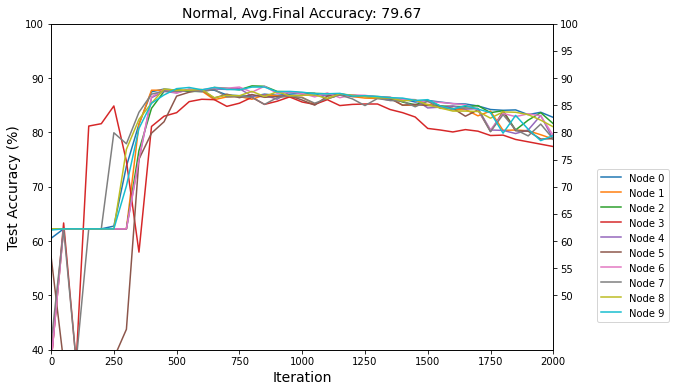

===========2 Layers(50%)==================
Number of nodes : 10
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :            1/2000   2/2000   3/2000   4/2000   5/2000   6/2000   7/2000   8/2000   9/2000  10/2000  11/2000  12/2000  13/2000  14/2000  15/2000  16/2000  17/2000  18/2000  19/2000  20/2000  21/2000  22/2000  23/2000  24/2000  25/2000  26/2000  27/2000  28/2000  29/2000  30/2000  31/2000  32/2000  33/2000  34/2000  35/2000  36/2000  37/2000  38/2000  39/2000  40/2000  41/2000  42/2000  43/2000  44/2000  45/2000  46/200

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

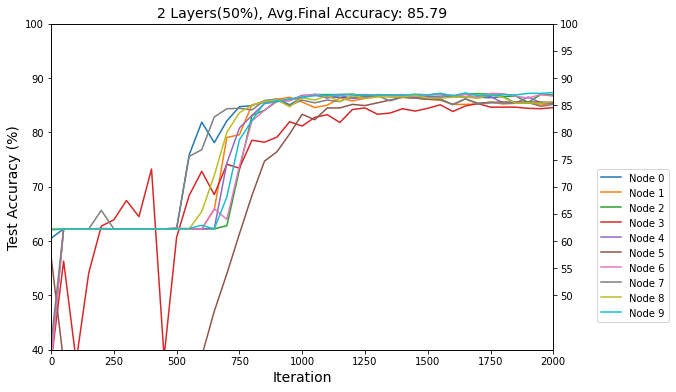

===========Partial Layers(25%)==================
Number of nodes : 10
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :            1/2000   2/2000   3/2000   4/2000   5/2000   6/2000   7/2000   8/2000   9/2000  10/2000  11/2000  12/2000  13/2000  14/2000  15/2000  16/2000  17/2000  18/2000  19/2000  20/2000  21/2000  22/2000  23/2000  24/2000  25/2000  26/2000  27/2000  28/2000  29/2000  30/2000  31/2000  32/2000  33/2000  34/2000  35/2000  36/2000  37/2000  38/2000  39/2000  40/2000  41/2000  42/2000  43/2000  44/2000  45/2000  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

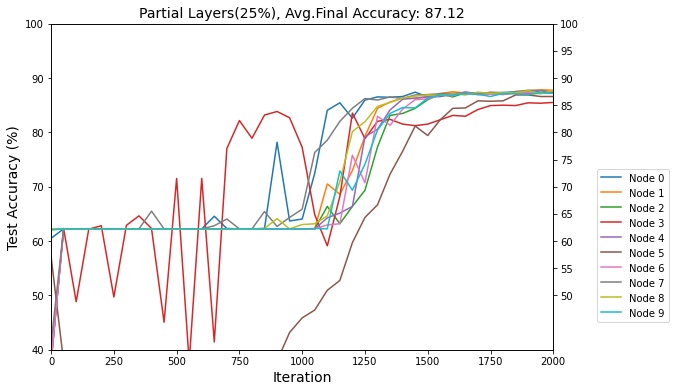

===========Partial Layers(50%)==================
Number of nodes : 10
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :            1/2000   2/2000   3/2000   4/2000   5/2000   6/2000   7/2000   8/2000   9/2000  10/2000  11/2000  12/2000  13/2000  14/2000  15/2000  16/2000  17/2000  18/2000  19/2000  20/2000  21/2000  22/2000  23/2000  24/2000  25/2000  26/2000  27/2000  28/2000  29/2000  30/2000  31/2000  32/2000  33/2000  34/2000  35/2000  36/2000  37/2000  38/2000  39/2000  40/2000  41/2000  42/2000  43/2000  44/2000  45/2000  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

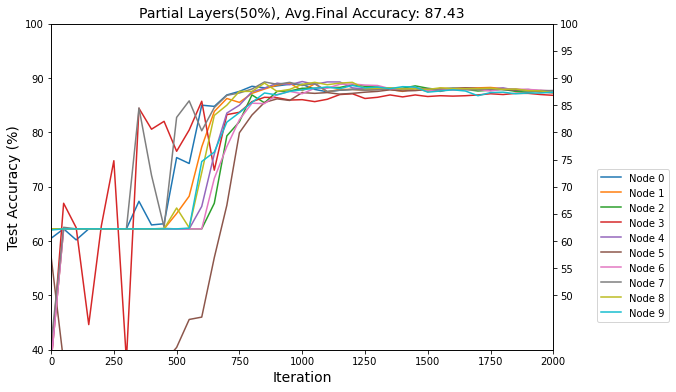

===========LOCAL-ONLY NODES==================
Data samples per node : 10
iteration :            1/2000   2/2000   3/2000   4/2000   5/2000   6/2000   7/2000   8/2000   9/2000  10/2000  11/2000  12/2000  13/2000  14/2000  15/2000  16/2000  17/2000  18/2000  19/2000  20/2000  21/2000  22/2000  23/2000  24/2000  25/2000  26/2000  27/2000  28/2000  29/2000  30/2000  31/2000  32/2000  33/2000  34/2000  35/2000  36/2000  37/2000  38/2000  39/2000  40/2000  41/2000  42/2000  43/2000  44/2000  45/2000  46/2000  47/2000  48/2000  49/2000  50/2000

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

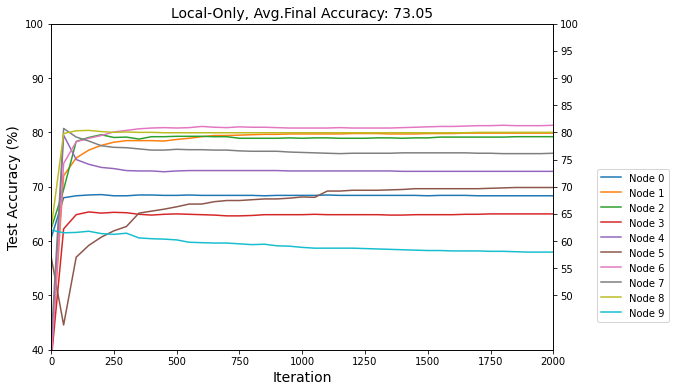

===========SINGLE NODE WITH ENTIRE DATASET==================
Total Data samples  : 100
iteration :            1/2000   2/2000   3/2000   4/2000   5/2000   6/2000   7/2000   8/2000   9/2000  10/2000  11/2000  12/2000  13/2000  14/2000  15/2000  16/2000  17/2000  18/2000  19/2000  20/2000  21/2000  22/2000  23/2000  24/2000  25/2000  26/2000  27/2000  28/2000  29/2000  30/2000  31/2000  32/2000  33/2000  34/2000  35/2000  36/2000  37/2000  38/2000  39/2000  40/2000  41/2000  42/2000  43/2000  44/2000  45/2000  46/2000  47/2000  48/2000  49/2000  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

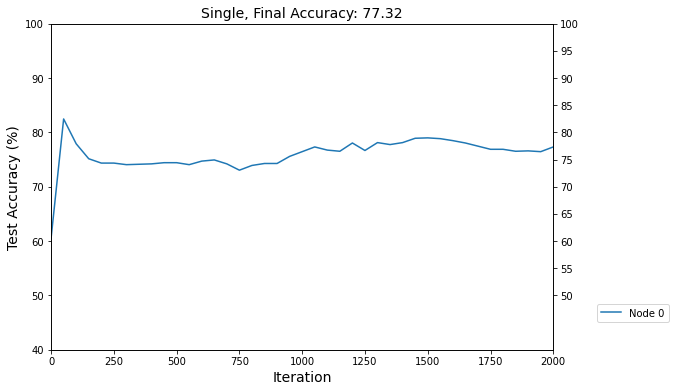

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

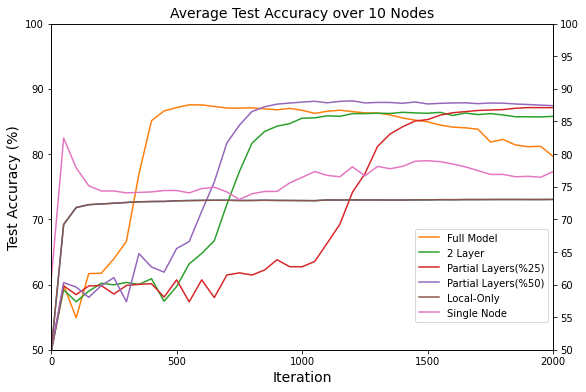

In [ ]:

labels = ['Normal','2 Layers(50%)','Partial Layers(25%)','Partial Layers(50%)','Local-Only','Single']
NodeTypes = [Node,PNode,PLNode,PLNode2]
interval = 50 #accuracy mesaurement interval
ddlresults=[]


for i in range(len(NodeTypes)):
    r = ddl(NodeTypes[i],interval,labels[i])
    plot_accuracy(r,labels[i],True)
    ddlresults.append(r)

mode='Local-Only'
r4=localonly(interval) #only local tranining without model exchange
plot_accuracy(r4,mode,True)


mode='Single'
r5=single(interval) #single node has entire dataset
plot_accuracy_single(r5,mode,True)

allresults = ddlresults[:]
allresults.append(r4)
allresults.append(r5)

plot_avg(allresults,r5,labels,'Average',True)





===========Normal==================
Number of nodes : 20
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :            1/4000   2/4000   3/4000   4/4000   5/4000   6/4000   7/4000   8/4000   9/4000  10/4000  11/4000  12/4000  13/4000  14/4000  15/4000  16/4000  17/4000  18/4000  19/4000  20/4000  21/4000  22/4000  23/4000  24/4000  25/4000  26/4000  27/4000  28/4000  29/4000  30/4000  31/4000  32/4000  33/4000  34/4000  35/4000  36/4000  37/4000  38/4000  39/4000  40/4000  41/4000  42/4000  43/4000  44/4000  45/4000  46/4000

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

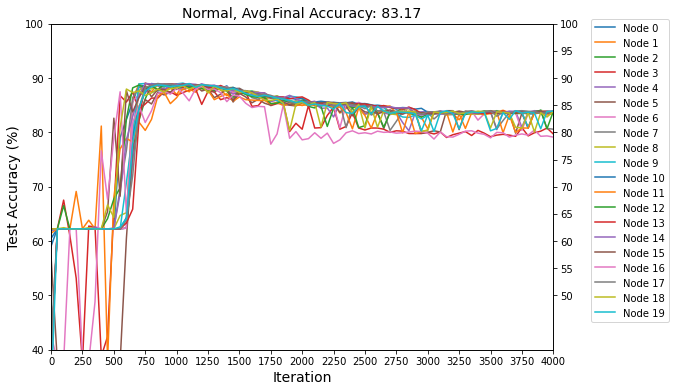

===========2 Layers(50%)==================
Number of nodes : 20
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :            1/4000   2/4000   3/4000   4/4000   5/4000   6/4000   7/4000   8/4000   9/4000  10/4000  11/4000  12/4000  13/4000  14/4000  15/4000  16/4000  17/4000  18/4000  19/4000  20/4000  21/4000  22/4000  23/4000  24/4000  25/4000  26/4000  27/4000  28/4000  29/4000  30/4000  31/4000  32/4000  33/4000  34/4000  35/4000  36/4000  37/4000  38/4000  39/4000  40/4000  41/4000  42/4000  43/4000  44/4000  45/4000  46/400

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

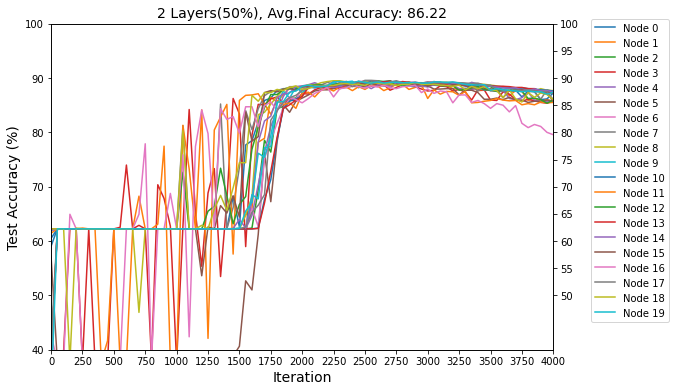

===========Partial Layers(25%)==================
Number of nodes : 20
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :            1/4000   2/4000   3/4000   4/4000   5/4000   6/4000   7/4000   8/4000   9/4000  10/4000  11/4000  12/4000  13/4000  14/4000  15/4000  16/4000  17/4000  18/4000  19/4000  20/4000  21/4000  22/4000  23/4000  24/4000  25/4000  26/4000  27/4000  28/4000  29/4000  30/4000  31/4000  32/4000  33/4000  34/4000  35/4000  36/4000  37/4000  38/4000  39/4000  40/4000  41/4000  42/4000  43/4000  44/4000  45/4000  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

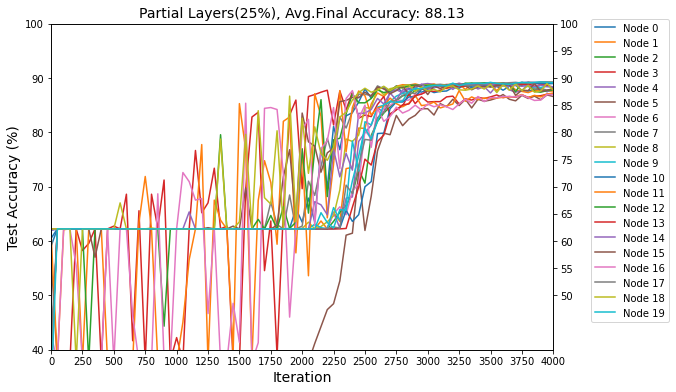

===========Partial Layers(50%)==================
Number of nodes : 20
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :            1/4000   2/4000   3/4000   4/4000   5/4000   6/4000   7/4000   8/4000   9/4000  10/4000  11/4000  12/4000  13/4000  14/4000  15/4000  16/4000  17/4000  18/4000  19/4000  20/4000  21/4000  22/4000  23/4000  24/4000  25/4000  26/4000  27/4000  28/4000  29/4000  30/4000  31/4000  32/4000  33/4000  34/4000  35/4000  36/4000  37/4000  38/4000  39/4000  40/4000  41/4000  42/4000  43/4000  44/4000  45/4000  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

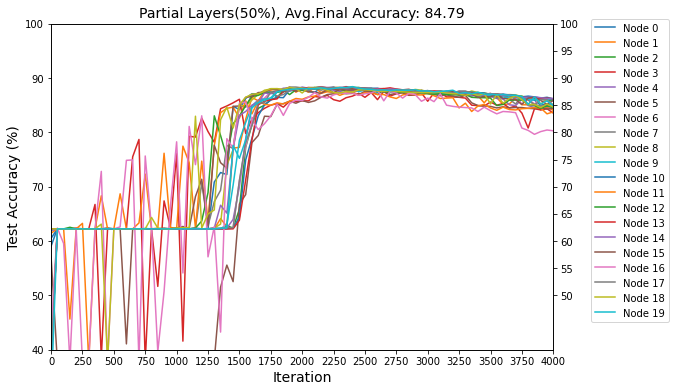

===========LOCAL-ONLY NODES==================
Data samples per node : 10
iteration :            1/4000   2/4000   3/4000   4/4000   5/4000   6/4000   7/4000   8/4000   9/4000  10/4000  11/4000  12/4000  13/4000  14/4000  15/4000  16/4000  17/4000  18/4000  19/4000  20/4000  21/4000  22/4000  23/4000  24/4000  25/4000  26/4000  27/4000  28/4000  29/4000  30/4000  31/4000  32/4000  33/4000  34/4000  35/4000  36/4000  37/4000  38/4000  39/4000  40/4000  41/4000  42/4000  43/4000  44/4000  45/4000  46/4000  47/4000  48/4000  49/4000  50/4000

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

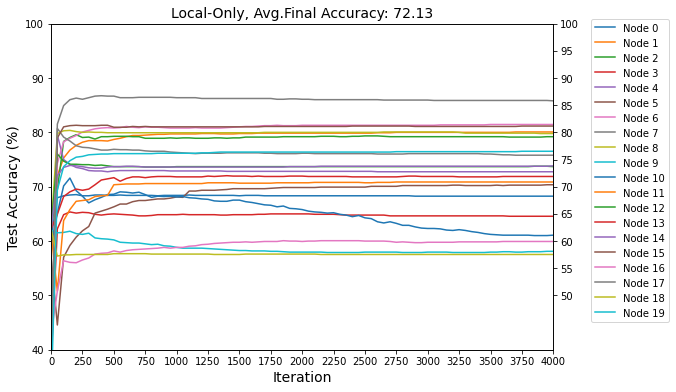

===========SINGLE NODE WITH ENTIRE DATASET==================
Total Data samples  : 200
iteration :            1/4000   2/4000   3/4000   4/4000   5/4000   6/4000   7/4000   8/4000   9/4000  10/4000  11/4000  12/4000  13/4000  14/4000  15/4000  16/4000  17/4000  18/4000  19/4000  20/4000  21/4000  22/4000  23/4000  24/4000  25/4000  26/4000  27/4000  28/4000  29/4000  30/4000  31/4000  32/4000  33/4000  34/4000  35/4000  36/4000  37/4000  38/4000  39/4000  40/4000  41/4000  42/4000  43/4000  44/4000  45/4000  46/4000  47/4000  48/4000  49/4000  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in exp
  """


2287/40002288/40002289/40002290/40002291/40002292/40002293/40002294/40002295/40002296/40002297/40002298/40002299/40002300/40002301/40002302/40002303/40002304/40002305/40002306/40002307/40002308/40002309/40002310/40002311/40002312/40002313/40002314/40002315/40002316/40002317/40002318/40002319/40002320/40002321/40002322/40002323/40002324/40002325/40002326/40002327/40002328/40002329/40002330/40002331/40002332/40002333/40002334/40002335/40002336/40002337/40002338/40002339/40002340/40002341/40002

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

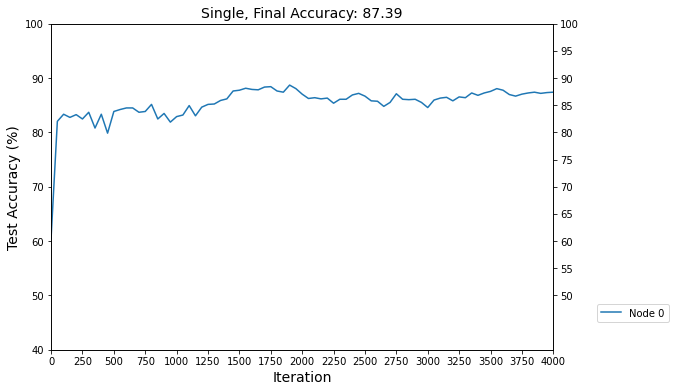

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

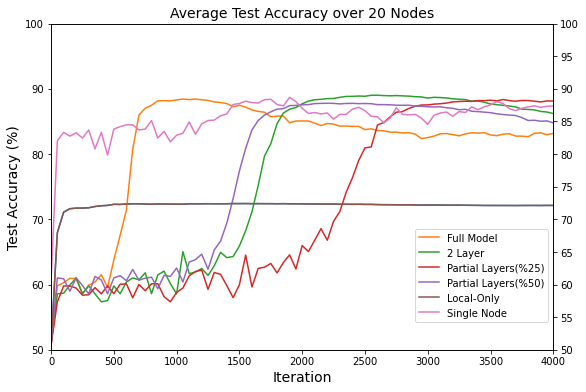

In [ ]:

labels = ['Normal','2 Layers(50%)','Partial Layers(25%)','Partial Layers(50%)','Local-Only','Single']
NodeTypes = [Node,PNode,PLNode,PLNode2]
interval = 50 #accuracy mesaurement interval
ddlresults=[]


for i in range(len(NodeTypes)):
    r = ddl(NodeTypes[i],interval,labels[i])
    plot_accuracy(r,labels[i],True)
    ddlresults.append(r)

mode='Local-Only'
r4=localonly(interval) #only local tranining without model exchange
plot_accuracy(r4,mode,True)


mode='Single'
r5=single(interval) #single node has entire dataset
plot_accuracy_single(r5,mode,True)

allresults = ddlresults[:]
allresults.append(r4)
allresults.append(r5)

plot_avg(allresults,'Average',True)


In [ ]:
#PARAMETERS
NUM_NODES         = 40  #number of worker nodes
MAX_ITERATION     = 30000 #number of iterations
DATA_PER_NODE     = 10
NUM_HIDDEN_NODES  = 32 # number of hidden nodes in neural network

#TRAINING PARAMETERS
LEARNING_RATE            =0.1
REGULARIZATION_PARAMETER =0.5
NUM_EPOCHS               =1 #Node uses its local dataset only once for each iteration
BATCH_SIZE               =2 #have to <= DATA_PER_NODE


#Data https://archive.ics.uci.edu/ml/datasets/spambase
dataset="spambase"
datasetpath = GD_PATH+"/"+dataset+".csv"
[X,Y,Xtest,Ytest] = importData(datasetpath)

#file name suffix
FNAME = '_n'+str(NUM_NODES)+ '_d'+str(DATA_PER_NODE)+'_i'+str(MAX_ITERATION)+\
        '_h'+ str(NUM_HIDDEN_NODES) + '_lr'+ str(LEARNING_RATE)+\
        '_bs'+str(BATCH_SIZE) + '_' + dataset

#2. SPLITTING DAT  
split_factor  = len(Y)/(DATA_PER_NODE)+1
X_splitted = np.array_split(X,split_factor)
X_splitted = X_splitted[:NUM_NODES]
Y_splitted = np.array_split(Y,split_factor) #len(Y_splitted[0])=len(X_splitted[0]) = DATA_PER_NODE
Y_splitted = Y_splitted[:NUM_NODES]
ni = len(X[0]) #number of inputs(features) in dataset
Node.NUM_HIDDEN_NODES=NUM_HIDDEN_NODES
nh=Node.NUM_HIDDEN_NODES #shortening notation
Node.sd=0 #Seed Value used for in distributed learning





===========2 Layers(50%)==================
Number of nodes : 40
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/30000    2/30000    3/30000    4/30000    5/30000    6/30000    7/30000    8/30000    9/30000   10/30000   11/30000   12/30000   13/30000   14/30000   15/30000   16/30000   17/30000   18/30000   19/30000   20/30000   21/30000   22/30000   23/30000   24/30000   25/30000   26/30000   27/30000   28/30000   29/30000   30/30000   31/30000   32/30000   33/30000   34/30000   35/30000   36/30000   37/30000

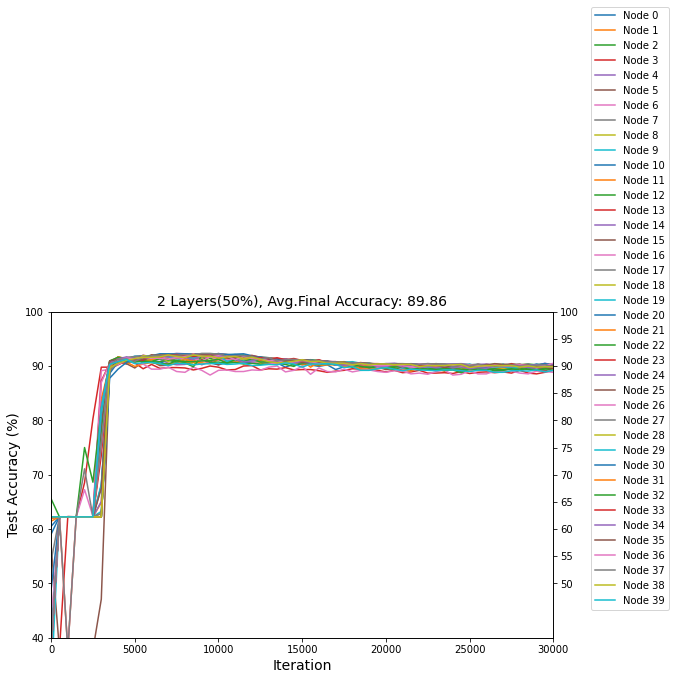





===========Partial Layers(25%)==================
Number of nodes : 40
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/30000    2/30000    3/30000    4/30000    5/30000    6/30000    7/30000    8/30000    9/30000   10/30000   11/30000   12/30000   13/30000   14/30000   15/30000   16/30000   17/30000   18/30000   19/30000   20/30000   21/30000   22/30000   23/30000   24/30000   25/30000   26/30000   27/30000   28/30000   29/30000   30/30000   31/30000   32/30000   33/30000   34/30000   35/30000   36/30000   37/30000

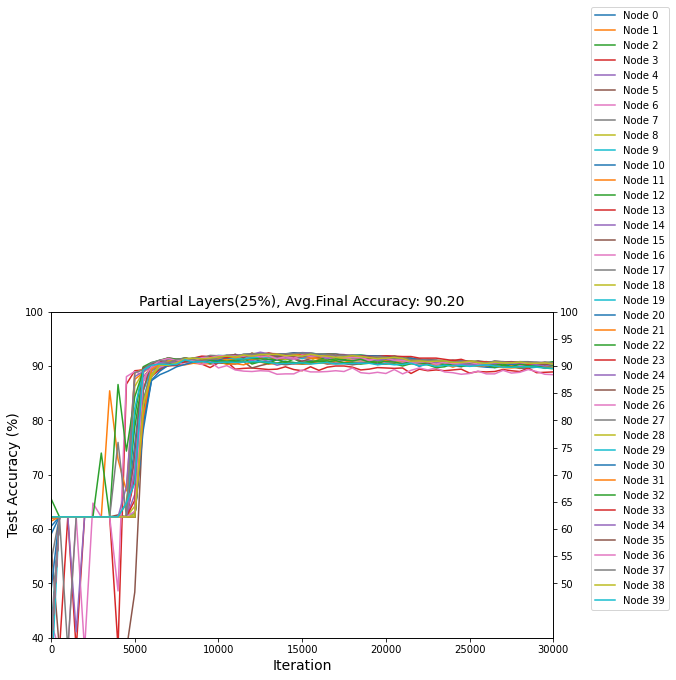





===========Partial Layers(50%)==================
Number of nodes : 40
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/30000    2/30000    3/30000    4/30000    5/30000    6/30000    7/30000    8/30000    9/30000   10/30000   11/30000   12/30000   13/30000   14/30000   15/30000   16/30000   17/30000   18/30000   19/30000   20/30000   21/30000   22/30000   23/30000   24/30000   25/30000   26/30000   27/30000   28/30000   29/30000   30/30000   31/30000   32/30000   33/30000   34/30000   35/30000   36/30000   37/30000

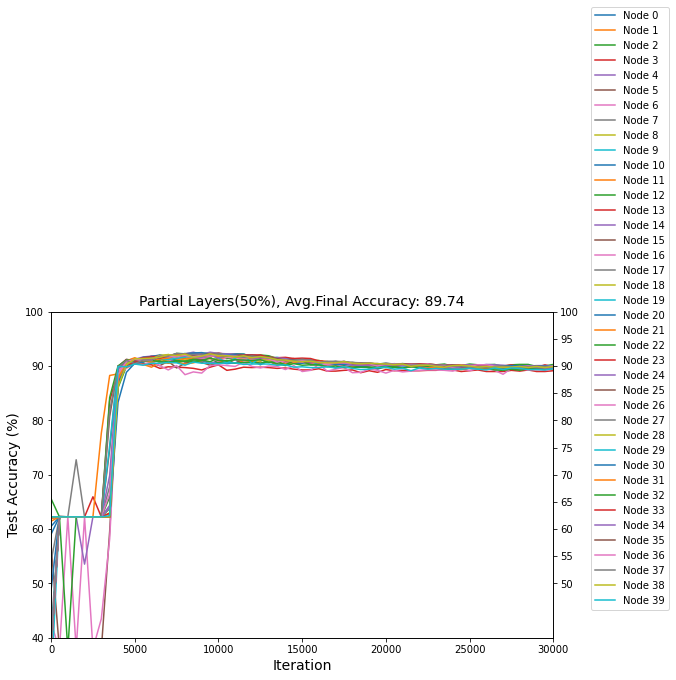





===========LOCAL-ONLY NODES==================
Data samples per node : 10
iteration :             1/30000    2/30000    3/30000    4/30000    5/30000    6/30000    7/30000    8/30000    9/30000   10/30000   11/30000   12/30000   13/30000   14/30000   15/30000   16/30000   17/30000   18/30000   19/30000   20/30000   21/30000   22/30000   23/30000   24/30000   25/30000   26/30000   27/30000   28/30000   29/30000   30/30000   31/30000   32/30000   33/30000   34/30000   35/30000   36/30000   37/30000   38/30000   39/30000   40/30000   41/30000

In [ ]:

labels = ['2 Layers(50%)','Partial Layers(25%)','Partial Layers(50%)','Local-Only','Single']
NodeTypes = [PNode,PLNode,PLNode2]
interval = 500 #accuracy mesaurement interval
ddlresults=[]


for i in range(len(NodeTypes)):
    r = ddl(NodeTypes[i],interval,labels[i])
    plot_accuracy(r,labels[i],True)
    ddlresults.append(r)

mode='Local-Only'
r4=localonly(interval) #only local tranining without model exchange
plot_accuracy(r4,mode,True)

allresults = ddlresults[:]
allresults.append(r4)
mode='Single'
r5=single(interval) #single node has entire dataset
plot_accuracy_single(r5,mode,True)

plot_avg(allresults,r5,labels,'Average',True)





===========SINGLE NODE WITH ENTIRE DATASET==================
Total Data samples  : 400
iteration :             1/30000    2/30000    3/30000    4/30000    5/30000    6/30000    7/30000    8/30000    9/30000   10/30000   11/30000   12/30000   13/30000   14/30000   15/30000   16/30000   17/30000   18/30000   19/30000   20/30000   21/30000   22/30000   23/30000   24/30000   25/30000   26/30000   27/30000   28/30000   29/30000   30/30000   31/30000   32/30000   33/30000   34/30000   35/30000   36/30000   37/30000   38/30000   39/30000   40/30000

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in exp
  """


 1330/30000 1331/30000 1332/30000 1333/30000 1334/30000 1335/30000 1336/30000 1337/30000 1338/30000 1339/30000 1340/30000 1341/30000 1342/30000 1343/30000 1344/30000 1345/30000 1346/30000 1347/30000 1348/30000 1349/30000 1350/30000 1351/30000 1352/30000 1353/30000 1354/30000 1355/30000 1356/30000 1357/30000 1358/30000 1359/30000 1360/30000 1361/30000 1362/30000 1363/30000 1364/30000 1365/30000 1366/30000 1367/30000 1368/30000 1369/30000 1370/30000 1371/30000 1372/30000 1373/30000 1374/30000

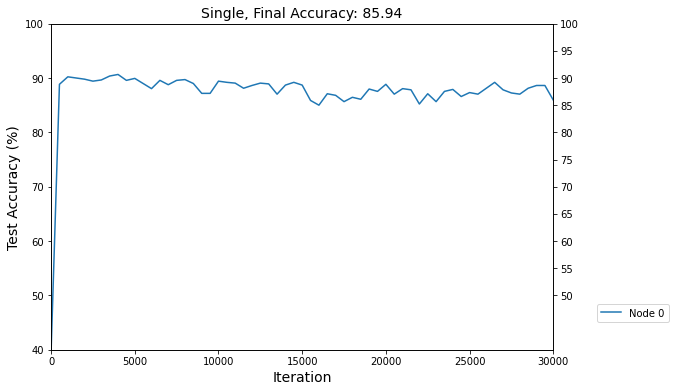

In [ ]:
interval=500
mode='Single'
r5=single(interval) #single node has entire dataset
plot_accuracy_single(r5,mode,True)





===========Normal==================
Number of nodes : 80
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/50000    2/50000    3/50000    4/50000    5/50000    6/50000    7/50000    8/50000    9/50000   10/50000   11/50000   12/50000   13/50000   14/50000   15/50000   16/50000   17/50000   18/50000   19/50000   20/50000   21/50000   22/50000   23/50000   24/50000   25/50000   26/50000   27/50000   28/50000   29/50000   30/50000   31/50000   32/50000   33/50000   34/50000   35/50000   36/50000   37/50000   38

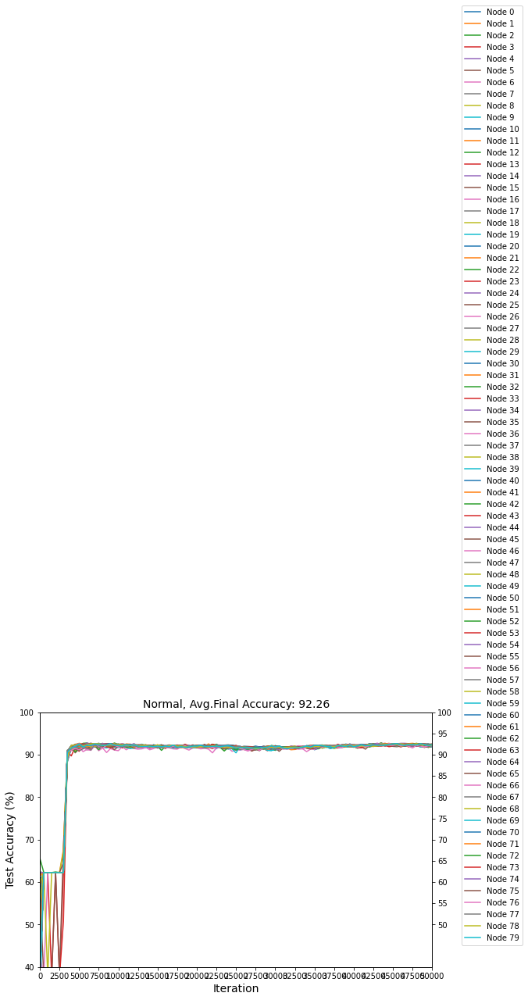





===========2 Layers(50%)==================
Number of nodes : 80
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/50000    2/50000    3/50000    4/50000    5/50000    6/50000    7/50000    8/50000    9/50000   10/50000   11/50000   12/50000   13/50000   14/50000   15/50000   16/50000   17/50000   18/50000   19/50000   20/50000   21/50000   22/50000   23/50000   24/50000   25/50000   26/50000   27/50000   28/50000   29/50000   30/50000   31/50000   32/50000   33/50000   34/50000   35/50000   36/50000   37/50000

In [ ]:
#PARAMETERS
NUM_NODES         = 80  #number of worker nodes
MAX_ITERATION     = 50000 #number of iterations
DATA_PER_NODE     = 10
NUM_HIDDEN_NODES  = 32 # number of hidden nodes in neural network

#TRAINING PARAMETERS
LEARNING_RATE            =0.1
REGULARIZATION_PARAMETER =0.5
NUM_EPOCHS               =1 #Node uses its local dataset only once for each iteration
BATCH_SIZE               =2 #have to <= DATA_PER_NODE


#Data https://archive.ics.uci.edu/ml/datasets/spambase
dataset="spambase"
datasetpath = GD_PATH+"/"+dataset+".csv"
[X,Y,Xtest,Ytest] = importData(datasetpath")

#file name suffix
FNAME = '_n'+str(NUM_NODES)+ '_d'+str(DATA_PER_NODE)+'_i'+str(MAX_ITERATION)+\
        '_h'+ str(NUM_HIDDEN_NODES) + '_lr'+ str(LEARNING_RATE)+\
        '_bs'+str(BATCH_SIZE) + '_' + dataset

#2. SPLITTING DAT  
split_factor  = len(Y)/(DATA_PER_NODE)+1
X_splitted = np.array_split(X,split_factor)
X_splitted = X_splitted[:NUM_NODES]
Y_splitted = np.array_split(Y,split_factor) #len(Y_splitted[0])=len(X_splitted[0]) = DATA_PER_NODE
Y_splitted = Y_splitted[:NUM_NODES]
ni = len(X[0]) #number of inputs(features) in dataset
Node.NUM_HIDDEN_NODES=NUM_HIDDEN_NODES
nh=Node.NUM_HIDDEN_NODES #shortening notation
Node.sd=0 #Seed Value used for in distributed learning



labels = ['Normal','2 Layers(50%)','Partial Layers(25%)','Partial Layers(50%)','Local-Only','Single']
NodeTypes = [Node,PNode,PLNode,PLNode2]
interval = 500 #accuracy mesaurement interval
ddlresults=[]


for i in range(len(NodeTypes)):
    r = ddl(NodeTypes[i],interval,labels[i])
    plot_accuracy(r,labels[i],True)
    ddlresults.append(r)

mode='Local-Only'
r4=localonly(interval) #only local tranining without model exchange
plot_accuracy(r4,mode,True)

allresults = ddlresults[:]
allresults.append(r4)
mode='Single'
r5=single(interval) #single node has entire dataset
plot_accuracy_single(r5,mode,True)

plot_avg(allresults,r5,labels,'Average',True)

In [ ]:
#PARAMETERS
NUM_NODES         = 80  #number of worker nodes
MAX_ITERATION     = 50000 #number of iterations
DATA_PER_NODE     = 10
NUM_HIDDEN_NODES  = 32 # number of hidden nodes in neural network

#TRAINING PARAMETERS
LEARNING_RATE            =0.1
REGULARIZATION_PARAMETER =0.5
NUM_EPOCHS               =1 #Node uses its local dataset only once for each iteration
BATCH_SIZE               =2 #have to <= DATA_PER_NODE


#Data https://archive.ics.uci.edu/ml/datasets/spambase
dataset="spambase"
datasetpath = GD_PATH+"/"+dataset+".csv"
[X,Y,Xtest,Ytest] = importData(datasetpath)

#file name suffix
FNAME = '_n'+str(NUM_NODES)+ '_d'+str(DATA_PER_NODE)+'_i'+str(MAX_ITERATION)+\
        '_h'+ str(NUM_HIDDEN_NODES) + '_lr'+ str(LEARNING_RATE)+\
        '_bs'+str(BATCH_SIZE) + '_' + dataset

#2. SPLITTING DAT  
split_factor  = len(Y)/(DATA_PER_NODE)+1
X_splitted = np.array_split(X,split_factor)
X_splitted = X_splitted[:NUM_NODES]
Y_splitted = np.array_split(Y,split_factor) #len(Y_splitted[0])=len(X_splitted[0]) = DATA_PER_NODE
Y_splitted = Y_splitted[:NUM_NODES]
ni = len(X[0]) #number of inputs(features) in dataset
Node.NUM_HIDDEN_NODES=NUM_HIDDEN_NODES
nh=Node.NUM_HIDDEN_NODES #shortening notation
Node.sd=0 #Seed Value used for in distributed learning



labels = ['Normal','2 Layers(50%)','Partial Layers(25%)','Partial Layers(50%)','Local-Only','Single']
NodeTypes = [Node,PNode,PLNode,PLNode2]
interval = 500 #accuracy mesaurement interval
ddlresults=[]






===========2 Layers(50%)==================
Number of nodes : 80
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/50000    2/50000    3/50000    4/50000    5/50000    6/50000    7/50000    8/50000    9/50000   10/50000   11/50000   12/50000   13/50000   14/50000   15/50000   16/50000   17/50000   18/50000   19/50000   20/50000   21/50000   22/50000   23/50000   24/50000   25/50000   26/50000   27/50000   28/50000   29/50000   30/50000   31/50000   32/50000   33/50000   34/50000   35/50000   36/50000   37/50000

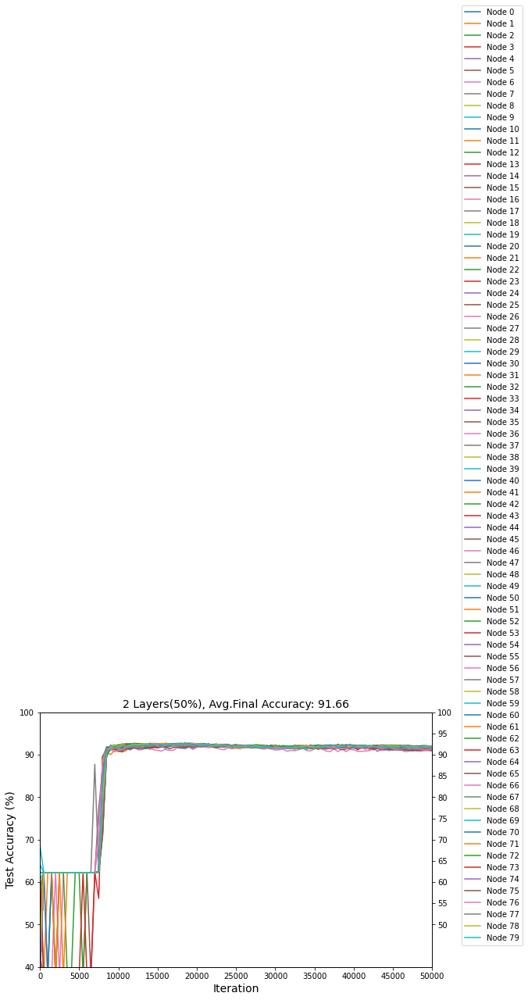

In [ ]:
interval=500
r = ddl(NodeTypes[1],interval,labels[1])
plot_accuracy(r,labels[1],True)





===========Normal==================
Number of nodes : 20
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/10000    2/10000    3/10000    4/10000    5/10000    6/10000    7/10000    8/10000    9/10000   10/10000   11/10000   12/10000   13/10000   14/10000   15/10000   16/10000   17/10000   18/10000   19/10000   20/10000   21/10000   22/10000   23/10000   24/10000   25/10000   26/10000   27/10000   28/10000   29/10000   30/10000   31/10000   32/10000   33/10000   34/10000   35/10000   36/10000   37/10000   38

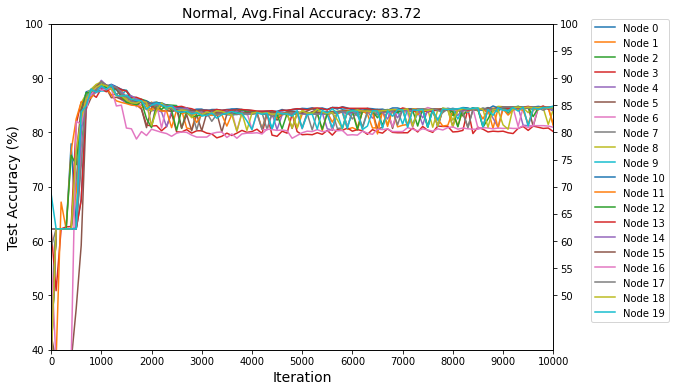





===========2 Layers(50%)==================
Number of nodes : 20
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/10000    2/10000    3/10000    4/10000    5/10000    6/10000    7/10000    8/10000    9/10000   10/10000   11/10000   12/10000   13/10000   14/10000   15/10000   16/10000   17/10000   18/10000   19/10000   20/10000   21/10000   22/10000   23/10000   24/10000   25/10000   26/10000   27/10000   28/10000   29/10000   30/10000   31/10000   32/10000   33/10000   34/10000   35/10000   36/10000   37/10000

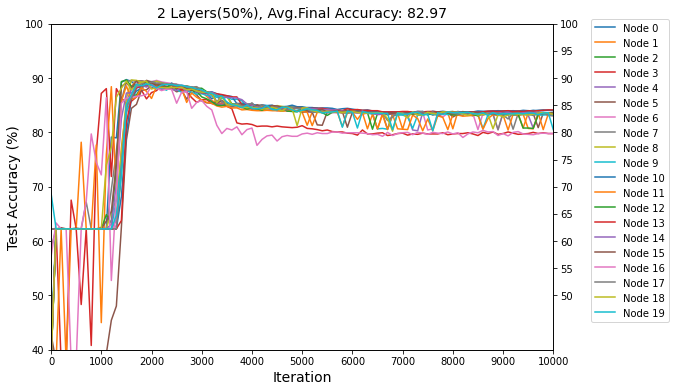





===========Partial Layers(25%)==================
Number of nodes : 20
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/10000    2/10000    3/10000    4/10000    5/10000    6/10000    7/10000    8/10000    9/10000   10/10000   11/10000   12/10000   13/10000   14/10000   15/10000   16/10000   17/10000   18/10000   19/10000   20/10000   21/10000   22/10000   23/10000   24/10000   25/10000   26/10000   27/10000   28/10000   29/10000   30/10000   31/10000   32/10000   33/10000   34/10000   35/10000   36/10000   37/10000

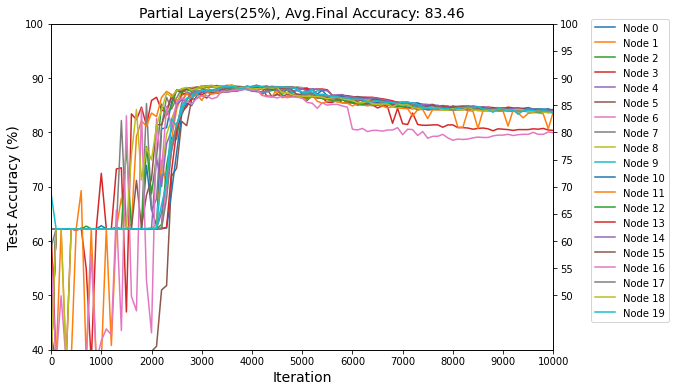





===========Partial Layers(50%)==================
Number of nodes : 20
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/10000    2/10000    3/10000    4/10000    5/10000    6/10000    7/10000    8/10000    9/10000   10/10000   11/10000   12/10000   13/10000   14/10000   15/10000   16/10000   17/10000   18/10000   19/10000   20/10000   21/10000   22/10000   23/10000   24/10000   25/10000   26/10000   27/10000   28/10000   29/10000   30/10000   31/10000   32/10000   33/10000   34/10000   35/10000   36/10000   37/10000

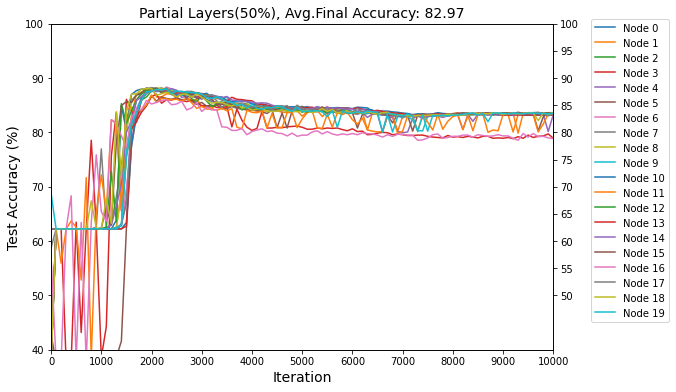





===========LOCAL-ONLY NODES==================
Data samples per node : 10
iteration :             1/10000    2/10000    3/10000    4/10000    5/10000    6/10000    7/10000    8/10000    9/10000   10/10000   11/10000   12/10000   13/10000   14/10000   15/10000   16/10000   17/10000   18/10000   19/10000   20/10000   21/10000   22/10000   23/10000   24/10000   25/10000   26/10000   27/10000   28/10000   29/10000   30/10000   31/10000   32/10000   33/10000   34/10000   35/10000   36/10000   37/10000   38/10000   39/10000   40/10000   41/10000

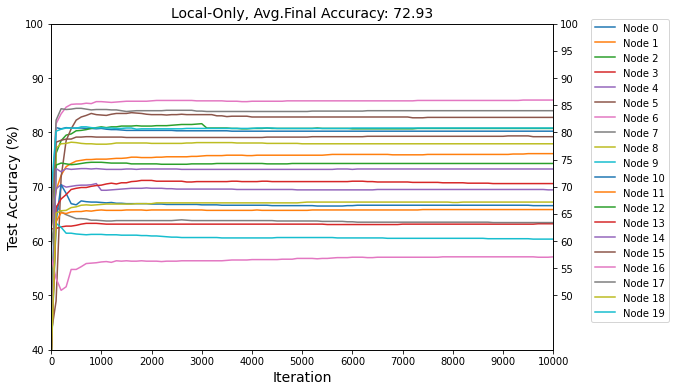





===========SINGLE NODE WITH ENTIRE DATASET==================
Total Data samples  : 200
iteration :             1/10000    2/10000    3/10000    4/10000    5/10000    6/10000    7/10000    8/10000    9/10000   10/10000   11/10000   12/10000   13/10000   14/10000   15/10000   16/10000   17/10000   18/10000   19/10000   20/10000   21/10000   22/10000   23/10000   24/10000   25/10000   26/10000   27/10000   28/10000   29/10000   30/10000   31/10000   32/10000   33/10000   34/10000   35/10000   36/10000   37/10000   38/10000   39/10000   40/10000

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: overflow encountered in exp
  """


 2007/10000 2008/10000 2009/10000 2010/10000 2011/10000 2012/10000 2013/10000 2014/10000 2015/10000 2016/10000 2017/10000 2018/10000 2019/10000 2020/10000 2021/10000 2022/10000 2023/10000 2024/10000 2025/10000 2026/10000 2027/10000 2028/10000 2029/10000 2030/10000 2031/10000 2032/10000 2033/10000 2034/10000 2035/10000 2036/10000 2037/10000 2038/10000 2039/10000 2040/10000 2041/10000 2042/10000 2043/10000 2044/10000 2045/10000 2046/10000 2047/10000 2048/10000 2049/10000 2050/10000 2051/10000

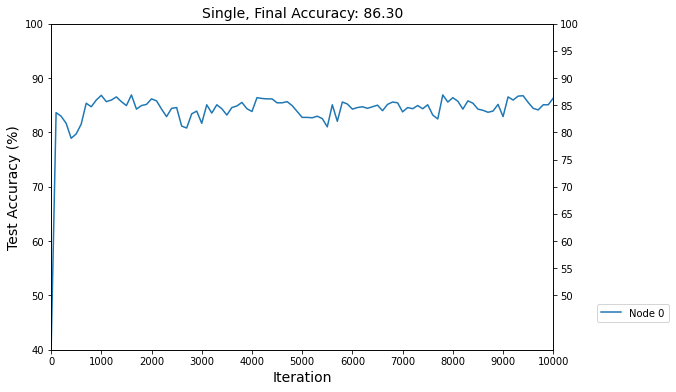

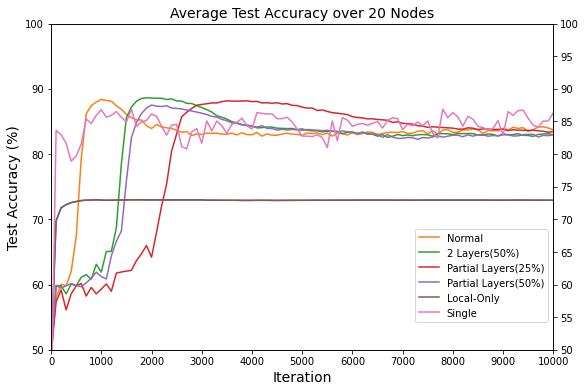

In [ ]:
#PARAMETERS
NUM_NODES         = 20  #number of worker nodes
MAX_ITERATION     = 10000 #number of iterations
DATA_PER_NODE     = 10
NUM_HIDDEN_NODES  = 32 # number of hidden nodes in neural network

#TRAINING PARAMETERS
LEARNING_RATE            =0.1
REGULARIZATION_PARAMETER =0.5
NUM_EPOCHS               =1 #Node uses its local dataset only once for each iteration
BATCH_SIZE               =2 #have to <= DATA_PER_NODE


#Data https://archive.ics.uci.edu/ml/datasets/spambase
dataset="spambase"
datasetpath = GD_PATH+"/"+dataset+".csv"
[X,Y,Xtest,Ytest] = importData(datasetpath)

#file name suffix
FNAME = '_n'+str(NUM_NODES)+ '_d'+str(DATA_PER_NODE)+'_i'+str(MAX_ITERATION)+\
        '_h'+ str(NUM_HIDDEN_NODES) + '_lr'+ str(LEARNING_RATE)+\
        '_bs'+str(BATCH_SIZE) + '_' + dataset

#2. SPLITTING DAT  
split_factor  = len(Y)/(DATA_PER_NODE)+1
X_splitted = np.array_split(X,split_factor)
X_splitted = X_splitted[:NUM_NODES]
Y_splitted = np.array_split(Y,split_factor) #len(Y_splitted[0])=len(X_splitted[0]) = DATA_PER_NODE
Y_splitted = Y_splitted[:NUM_NODES]
ni = len(X[0]) #number of inputs(features) in dataset
Node.NUM_HIDDEN_NODES=NUM_HIDDEN_NODES
nh=Node.NUM_HIDDEN_NODES #shortening notation
Node.sd=0 #Seed Value used for in distributed learning



labels = ['Normal','2 Layers(50%)','Partial Layers(25%)','Partial Layers(50%)','Local-Only','Single']
NodeTypes = [Node,PNode,PLNode,PLNode2]
interval = 100 #accuracy mesaurement interval
ddlresults=[]


for i in range(len(NodeTypes)):
    r = ddl(NodeTypes[i],interval,labels[i])
    plot_accuracy(r,labels[i],True)
    ddlresults.append(r)

mode='Local-Only'
r4=localonly(interval) #only local tranining without model exchange
plot_accuracy(r4,mode,True)

allresults = ddlresults[:]
allresults.append(r4)
mode='Single'
r5=single(interval) #single node has entire dataset
plot_accuracy_single(r5,mode,True)

plot_avg(allresults,r5,labels,'Average',True)





===========Normal==================
Number of nodes : 10
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/ 5000    2/ 5000    3/ 5000    4/ 5000    5/ 5000    6/ 5000    7/ 5000    8/ 5000    9/ 5000   10/ 5000   11/ 5000   12/ 5000   13/ 5000   14/ 5000   15/ 5000   16/ 5000   17/ 5000   18/ 5000   19/ 5000   20/ 5000   21/ 5000   22/ 5000   23/ 5000   24/ 5000   25/ 5000   26/ 5000   27/ 5000   28/ 5000   29/ 5000   30/ 5000   31/ 5000   32/ 5000   33/ 5000   34/ 5000   35/ 5000   36/ 5000   37/ 5000   38

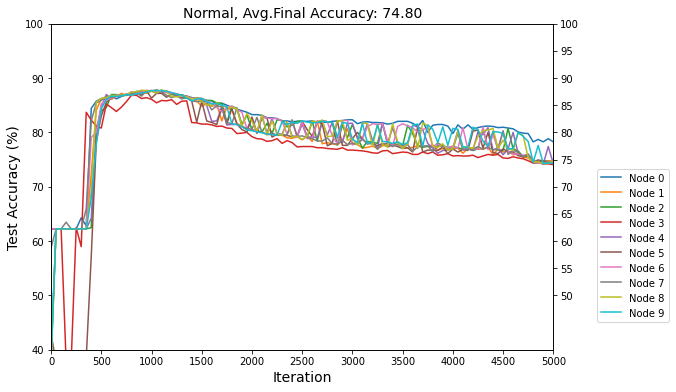





===========2 Layers(50%)==================
Number of nodes : 10
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/ 5000    2/ 5000    3/ 5000    4/ 5000    5/ 5000    6/ 5000    7/ 5000    8/ 5000    9/ 5000   10/ 5000   11/ 5000   12/ 5000   13/ 5000   14/ 5000   15/ 5000   16/ 5000   17/ 5000   18/ 5000   19/ 5000   20/ 5000   21/ 5000   22/ 5000   23/ 5000   24/ 5000   25/ 5000   26/ 5000   27/ 5000   28/ 5000   29/ 5000   30/ 5000   31/ 5000   32/ 5000   33/ 5000   34/ 5000   35/ 5000   36/ 5000   37/ 5000

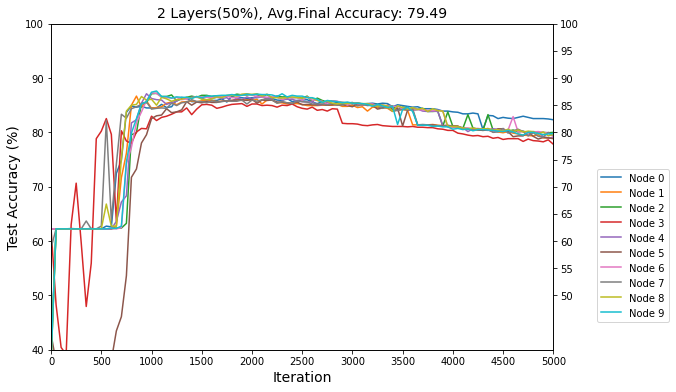





===========Partial Layers(25%)==================
Number of nodes : 10
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/ 5000    2/ 5000    3/ 5000    4/ 5000    5/ 5000    6/ 5000    7/ 5000    8/ 5000    9/ 5000   10/ 5000   11/ 5000   12/ 5000   13/ 5000   14/ 5000   15/ 5000   16/ 5000   17/ 5000   18/ 5000   19/ 5000   20/ 5000   21/ 5000   22/ 5000   23/ 5000   24/ 5000   25/ 5000   26/ 5000   27/ 5000   28/ 5000   29/ 5000   30/ 5000   31/ 5000   32/ 5000   33/ 5000   34/ 5000   35/ 5000   36/ 5000   37/ 5000

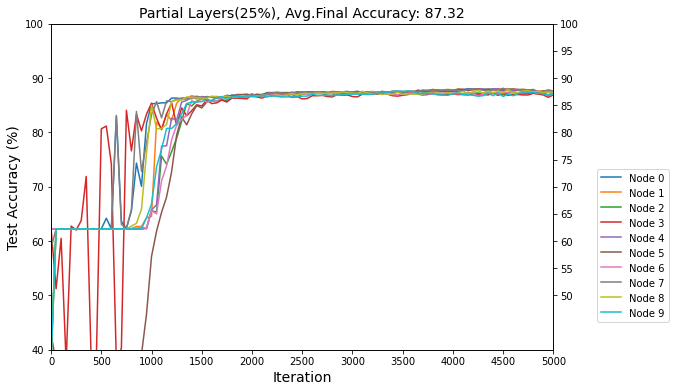





===========Partial Layers(50%)==================
Number of nodes : 10
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/ 5000    2/ 5000    3/ 5000    4/ 5000    5/ 5000    6/ 5000    7/ 5000    8/ 5000    9/ 5000   10/ 5000   11/ 5000   12/ 5000   13/ 5000   14/ 5000   15/ 5000   16/ 5000   17/ 5000   18/ 5000   19/ 5000   20/ 5000   21/ 5000   22/ 5000   23/ 5000   24/ 5000   25/ 5000   26/ 5000   27/ 5000   28/ 5000   29/ 5000   30/ 5000   31/ 5000   32/ 5000   33/ 5000   34/ 5000   35/ 5000   36/ 5000   37/ 5000

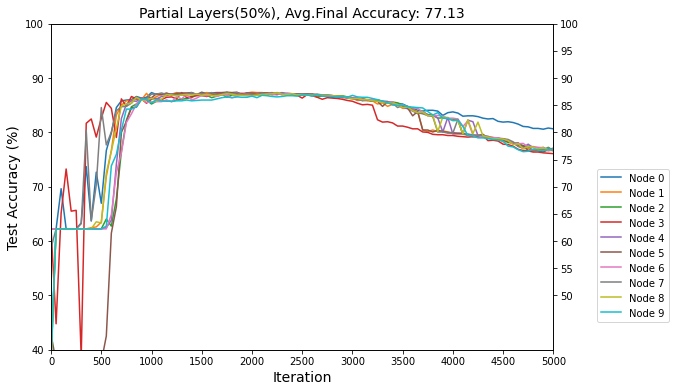





===========LOCAL-ONLY NODES==================
Data samples per node : 10
iteration :             1/ 5000    2/ 5000    3/ 5000    4/ 5000    5/ 5000    6/ 5000    7/ 5000    8/ 5000    9/ 5000   10/ 5000   11/ 5000   12/ 5000   13/ 5000   14/ 5000   15/ 5000   16/ 5000   17/ 5000   18/ 5000   19/ 5000   20/ 5000   21/ 5000   22/ 5000   23/ 5000   24/ 5000   25/ 5000   26/ 5000   27/ 5000   28/ 5000   29/ 5000   30/ 5000   31/ 5000   32/ 5000   33/ 5000   34/ 5000   35/ 5000   36/ 5000   37/ 5000   38/ 5000   39/ 5000   40/ 5000   41/ 5000

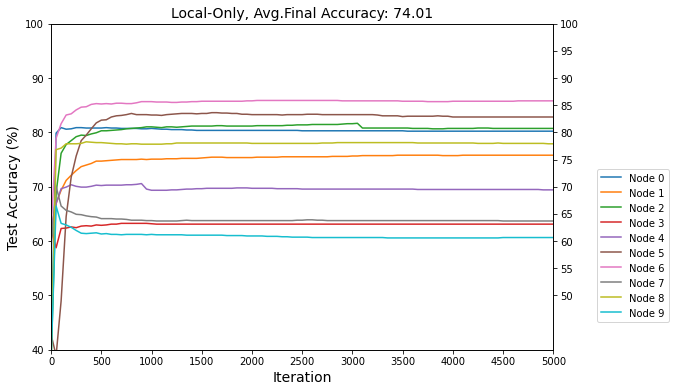





===========SINGLE NODE WITH ENTIRE DATASET==================
Total Data samples  : 100
iteration :             1/ 5000    2/ 5000    3/ 5000    4/ 5000    5/ 5000    6/ 5000    7/ 5000    8/ 5000    9/ 5000   10/ 5000   11/ 5000   12/ 5000   13/ 5000   14/ 5000   15/ 5000   16/ 5000   17/ 5000   18/ 5000   19/ 5000   20/ 5000   21/ 5000   22/ 5000   23/ 5000   24/ 5000   25/ 5000   26/ 5000   27/ 5000   28/ 5000   29/ 5000   30/ 5000   31/ 5000   32/ 5000   33/ 5000   34/ 5000   35/ 5000   36/ 5000   37/ 5000   38/ 5000   39/ 5000   40/ 5000

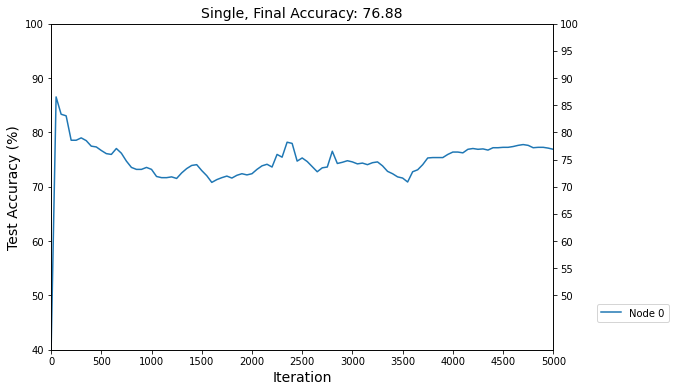

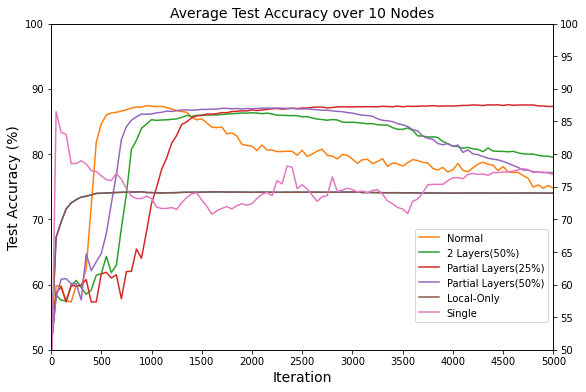

In [ ]:
#PARAMETERS
NUM_NODES         = 10  #number of worker nodes
MAX_ITERATION     = 5000 #number of iterations
DATA_PER_NODE     = 10
NUM_HIDDEN_NODES  = 32 # number of hidden nodes in neural network

#TRAINING PARAMETERS
LEARNING_RATE            =0.1
REGULARIZATION_PARAMETER =0.5
NUM_EPOCHS               =1 #Node uses its local dataset only once for each iteration
BATCH_SIZE               =2 #have to <= DATA_PER_NODE


#Data https://archive.ics.uci.edu/ml/datasets/spambase
dataset="spambase"
datasetpath = GD_PATH+"/"+dataset+".csv"
[X,Y,Xtest,Ytest] = importData(datasetpath)

#file name suffix
FNAME = '_n'+str(NUM_NODES)+ '_d'+str(DATA_PER_NODE)+'_i'+str(MAX_ITERATION)+\
        '_h'+ str(NUM_HIDDEN_NODES) + '_lr'+ str(LEARNING_RATE)+\
        '_bs'+str(BATCH_SIZE) + '_' + dataset

#2. SPLITTING DAT  
split_factor  = len(Y)/(DATA_PER_NODE)+1
X_splitted = np.array_split(X,split_factor)
X_splitted = X_splitted[:NUM_NODES]
Y_splitted = np.array_split(Y,split_factor) #len(Y_splitted[0])=len(X_splitted[0]) = DATA_PER_NODE
Y_splitted = Y_splitted[:NUM_NODES]
ni = len(X[0]) #number of inputs(features) in dataset
Node.NUM_HIDDEN_NODES=NUM_HIDDEN_NODES
nh=Node.NUM_HIDDEN_NODES #shortening notation
Node.sd=0 #Seed Value used for in distributed learning



labels = ['Normal','2 Layers(50%)','Partial Layers(25%)','Partial Layers(50%)','Local-Only','Single']
NodeTypes = [Node,PNode,PLNode,PLNode2]
interval = 50 #accuracy mesaurement interval
ddlresults=[]


for i in range(len(NodeTypes)):
    r = ddl(NodeTypes[i],interval,labels[i])
    plot_accuracy(r,labels[i],True)
    ddlresults.append(r)

mode='Local-Only'
r4=localonly(interval) #only local tranining without model exchange
plot_accuracy(r4,mode,True)

allresults = ddlresults[:]
allresults.append(r4)
mode='Single'
r5=single(interval) #single node has entire dataset
plot_accuracy_single(r5,mode,True)

plot_avg(allresults,r5,labels,'Average',True)





===========Normal==================
Number of nodes : 5
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/ 2000    2/ 2000    3/ 2000    4/ 2000    5/ 2000    6/ 2000    7/ 2000    8/ 2000    9/ 2000   10/ 2000   11/ 2000   12/ 2000   13/ 2000   14/ 2000   15/ 2000   16/ 2000   17/ 2000   18/ 2000   19/ 2000   20/ 2000   21/ 2000   22/ 2000   23/ 2000   24/ 2000   25/ 2000   26/ 2000   27/ 2000   28/ 2000   29/ 2000   30/ 2000   31/ 2000   32/ 2000   33/ 2000   34/ 2000   35/ 2000   36/ 2000   37/ 2000   38/

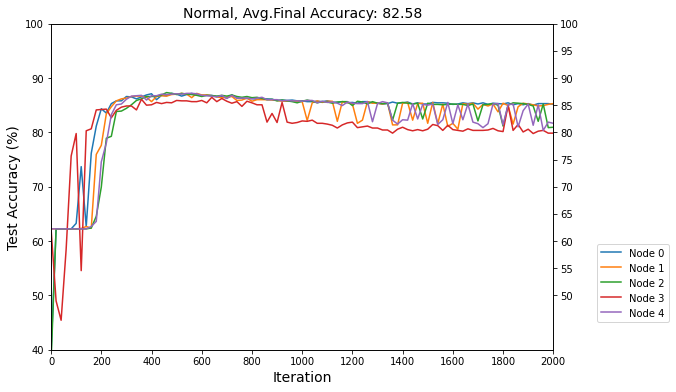





===========2 Layers(50%)==================
Number of nodes : 5
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/ 2000    2/ 2000    3/ 2000    4/ 2000    5/ 2000    6/ 2000    7/ 2000    8/ 2000    9/ 2000   10/ 2000   11/ 2000   12/ 2000   13/ 2000   14/ 2000   15/ 2000   16/ 2000   17/ 2000   18/ 2000   19/ 2000   20/ 2000   21/ 2000   22/ 2000   23/ 2000   24/ 2000   25/ 2000   26/ 2000   27/ 2000   28/ 2000   29/ 2000   30/ 2000   31/ 2000   32/ 2000   33/ 2000   34/ 2000   35/ 2000   36/ 2000   37/ 2000

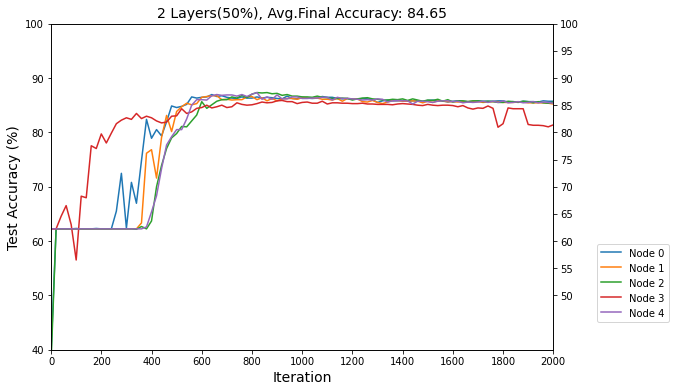





===========Partial Layers(25%)==================
Number of nodes : 5
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/ 2000    2/ 2000    3/ 2000    4/ 2000    5/ 2000    6/ 2000    7/ 2000    8/ 2000    9/ 2000   10/ 2000   11/ 2000   12/ 2000   13/ 2000   14/ 2000   15/ 2000   16/ 2000   17/ 2000   18/ 2000   19/ 2000   20/ 2000   21/ 2000   22/ 2000   23/ 2000   24/ 2000   25/ 2000   26/ 2000   27/ 2000   28/ 2000   29/ 2000   30/ 2000   31/ 2000   32/ 2000   33/ 2000   34/ 2000   35/ 2000   36/ 2000   37/ 2000

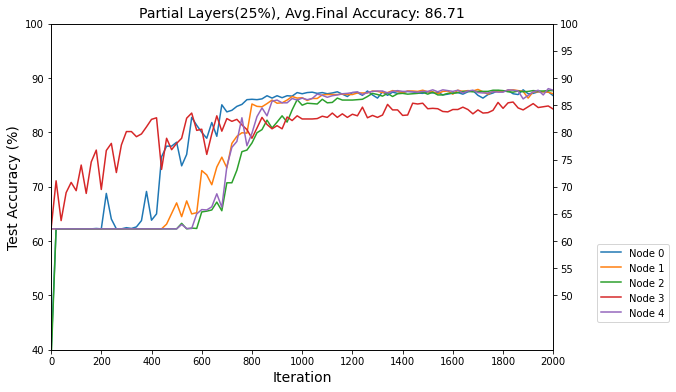





===========Partial Layers(50%)==================
Number of nodes : 5
Number of Hidden nodes : 32
Batchsize : 2
LR : 0.1
Epochs : 1
Data samples per node : 10
iteration :             1/ 2000    2/ 2000    3/ 2000    4/ 2000    5/ 2000    6/ 2000    7/ 2000    8/ 2000    9/ 2000   10/ 2000   11/ 2000   12/ 2000   13/ 2000   14/ 2000   15/ 2000   16/ 2000   17/ 2000   18/ 2000   19/ 2000   20/ 2000   21/ 2000   22/ 2000   23/ 2000   24/ 2000   25/ 2000   26/ 2000   27/ 2000   28/ 2000   29/ 2000   30/ 2000   31/ 2000   32/ 2000   33/ 2000   34/ 2000   35/ 2000   36/ 2000   37/ 2000

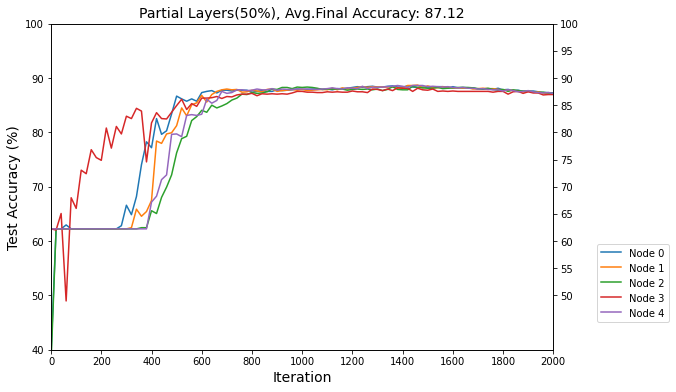





===========LOCAL-ONLY NODES==================
Data samples per node : 10
iteration :             1/ 2000    2/ 2000    3/ 2000    4/ 2000    5/ 2000    6/ 2000    7/ 2000    8/ 2000    9/ 2000   10/ 2000   11/ 2000   12/ 2000   13/ 2000   14/ 2000   15/ 2000   16/ 2000   17/ 2000   18/ 2000   19/ 2000   20/ 2000   21/ 2000   22/ 2000   23/ 2000   24/ 2000   25/ 2000   26/ 2000   27/ 2000   28/ 2000   29/ 2000   30/ 2000   31/ 2000   32/ 2000   33/ 2000   34/ 2000   35/ 2000   36/ 2000   37/ 2000   38/ 2000   39/ 2000   40/ 2000   41/ 2000

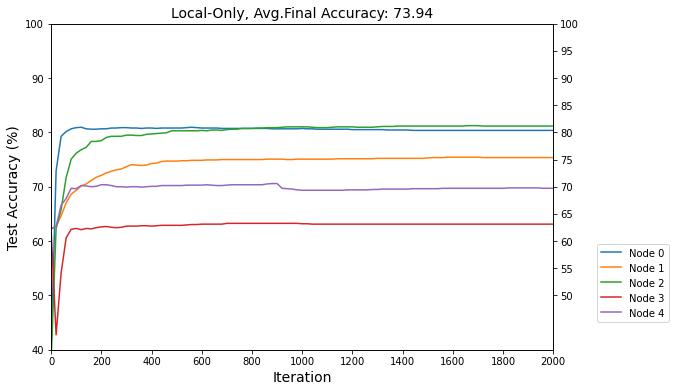





===========SINGLE NODE WITH ENTIRE DATASET==================
Total Data samples  : 50
iteration :             1/ 2000    2/ 2000    3/ 2000    4/ 2000    5/ 2000    6/ 2000    7/ 2000    8/ 2000    9/ 2000   10/ 2000   11/ 2000   12/ 2000   13/ 2000   14/ 2000   15/ 2000   16/ 2000   17/ 2000   18/ 2000   19/ 2000   20/ 2000   21/ 2000   22/ 2000   23/ 2000   24/ 2000   25/ 2000   26/ 2000   27/ 2000   28/ 2000   29/ 2000   30/ 2000   31/ 2000   32/ 2000   33/ 2000   34/ 2000   35/ 2000   36/ 2000   37/ 2000   38/ 2000   39/ 2000   40/ 2000

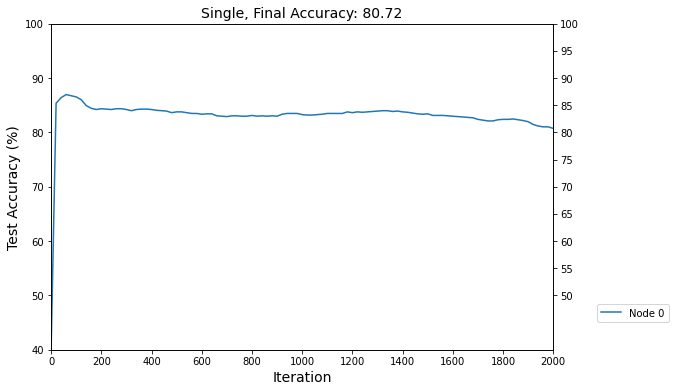

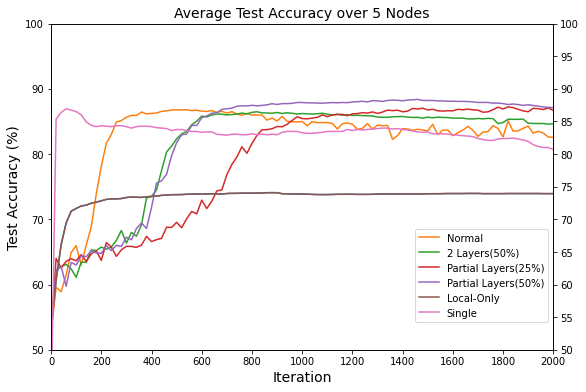

In [ ]:
#PARAMETERS
NUM_NODES         = 5  #number of worker nodes
MAX_ITERATION     = 2000 #number of iterations
DATA_PER_NODE     = 10
NUM_HIDDEN_NODES  = 32 # number of hidden nodes in neural network

#TRAINING PARAMETERS
LEARNING_RATE            =0.1
REGULARIZATION_PARAMETER =0.5
NUM_EPOCHS               =1 #Node uses its local dataset only once for each iteration
BATCH_SIZE               =2 #have to <= DATA_PER_NODE


#Data https://archive.ics.uci.edu/ml/datasets/spambase
dataset="spambase"
datasetpath = GD_PATH+"/"+dataset+".csv"
[X,Y,Xtest,Ytest] = importData(datasetpath)

#file name suffix
FNAME = '_n'+str(NUM_NODES)+ '_d'+str(DATA_PER_NODE)+'_i'+str(MAX_ITERATION)+\
        '_h'+ str(NUM_HIDDEN_NODES) + '_lr'+ str(LEARNING_RATE)+\
        '_bs'+str(BATCH_SIZE) + '_' + dataset

#2. SPLITTING DAT  
split_factor  = len(Y)/(DATA_PER_NODE)+1
X_splitted = np.array_split(X,split_factor)
X_splitted = X_splitted[:NUM_NODES]
Y_splitted = np.array_split(Y,split_factor) #len(Y_splitted[0])=len(X_splitted[0]) = DATA_PER_NODE
Y_splitted = Y_splitted[:NUM_NODES]
ni = len(X[0]) #number of inputs(features) in dataset
Node.NUM_HIDDEN_NODES=NUM_HIDDEN_NODES
nh=Node.NUM_HIDDEN_NODES #shortening notation
Node.sd=0 #Seed Value used for in distributed learning



labels = ['Normal','2 Layers(50%)','Partial Layers(25%)','Partial Layers(50%)','Local-Only','Single']
NodeTypes = [Node,PNode,PLNode,PLNode2]
interval = MAX_ITERATION/100 #accuracy mesaurement interval
ddlresults=[]


for i in range(len(NodeTypes)):
    r = ddl(NodeTypes[i],interval,labels[i])
    plot_accuracy(r,labels[i],True)
    ddlresults.append(r)

mode='Local-Only'
r4=localonly(interval) #only local tranining without model exchange
plot_accuracy(r4,mode,True)

allresults = ddlresults[:]
allresults.append(r4)
mode='Single'
r5=single(interval) #single node has entire dataset
plot_accuracy_single(r5,mode,True)

plot_avg(allresults,r5,labels,'Average',True)